# Abstract

We are looking for a correlation between the features of a mobile phone, such as RAM and internal memory, and its selling price. Instead of predicting the exact price, our goal is to determine a price range that indicates the general cost of the phone.

# Feature Description

1. battery_power: This denotes the battery power of the mobile
2. blue: This tels if the mobile has bluetooth or not
3. clock_speed: This denotes the clock speed of the mobile
4. dual_sim: This tells if the mobile has dual sim or not
5. fc: This denotes the front camera capacity of the mobile
6. four_g: This tells if the mobile has 4G or not
7. int_memory: This denotes the internal memory capacity of the mobile
8. m_dep: This denotes the mobile depth
9. mobile_wt: This denotes the mobile weight
10. n_cores: This denotes the number of cores the mobile has
11. pc: This denotes the primary camera capacity of the mobile
12. px_height: This denotes the pixel height in the mobile
13. px_width: This denotes the pixel width in the mobile
14. ram: This denotes the ram capacity of the mobile
15. sc_h: This denotes the screen height
16. sc_w: This denotes the screen width
17. talk_time: This denotes the talk time of the mobile
18. three_g: This tells if the mobile has 3G or not
19. touch_screen: This tells if the mobile has touch screen or not
20. wifi: This tells if the mobile has wifi or not
21. price_range: This is the target variable, depending on all the other variables, it tells the price range of the mobile either in 0, 1, 2, or 3

# Importing Libraries

In [ ]:
%pip install mlxtend --upgrade
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install shap
!pip install lime
!pip install --upgrade scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.3 MB/s eta 0:00:00
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
import codecs
import io
from statsmodels.graphics.gofplots import qqplot
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from scipy.stats import chi2_contingency
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import math
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from mlxtend.evaluate import bias_variance_decomp
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from scipy.stats import pearsonr
from statsmodels.stats.outliers_influence import variance_inflation_factor
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.linear_model import RidgeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import (partial_dependence, 
                                PartialDependenceDisplay)
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import graphviz
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

In [ ]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpit7qy2xn
  JVM stdout: /tmp/tmpit7qy2xn/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpit7qy2xn/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_nis3th
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# Loading Dataset

In [ ]:
test = "https://raw.githubusercontent.com/kmehul/Data-Science/main/Datasets/test.csv"
df_test = pd.read_csv(test)

train = "https://raw.githubusercontent.com/kmehul/Data-Science/main/Datasets/train.csv"
df_train = pd.read_csv(train)

In [ ]:
#Viewing the data
df_test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [ ]:
#Viewing the data
df_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


# Checking the datatypes of Variables in the training dataset

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

The data is split into numeric and categorical data types, with 14 numeric type and 7 categorical type data.

Numeric: battery_power, clock_speed, fc, int_memory, m_dep, mobile_wt, n_cores, pc, px_height, px_width, ram, sc_h, sc_w, talk_time

Categorical: blue, dual_sim, four-g, three-g, touch_screen, wifi, price_range

# Checking for Null values

In [ ]:
df_train.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

Thus, we can confirm that there are no missing values in the dataset.

# Checking the likely distribution of the numeric variables.

<Figure size 1600x1600 with 0 Axes>

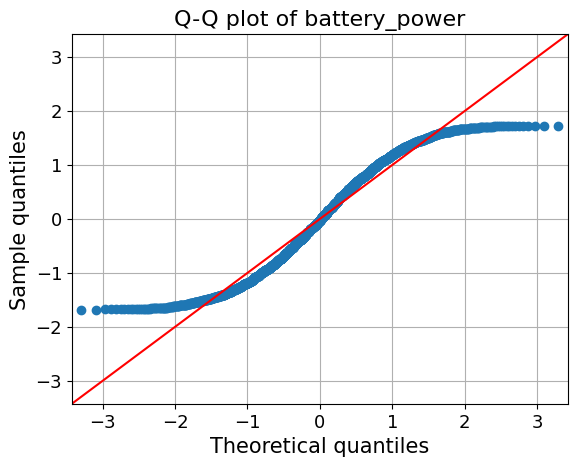

<Figure size 1600x1600 with 0 Axes>

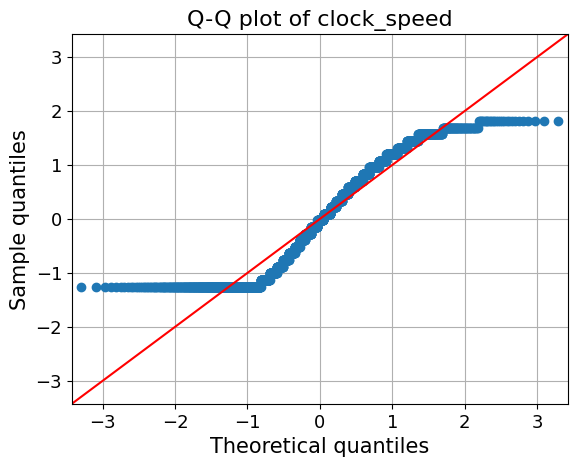

<Figure size 1600x1600 with 0 Axes>

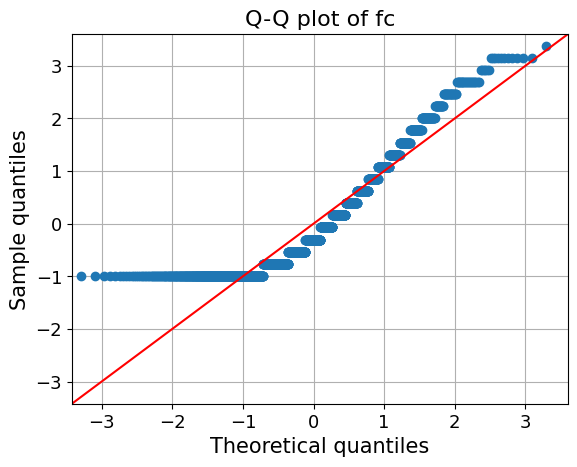

<Figure size 1600x1600 with 0 Axes>

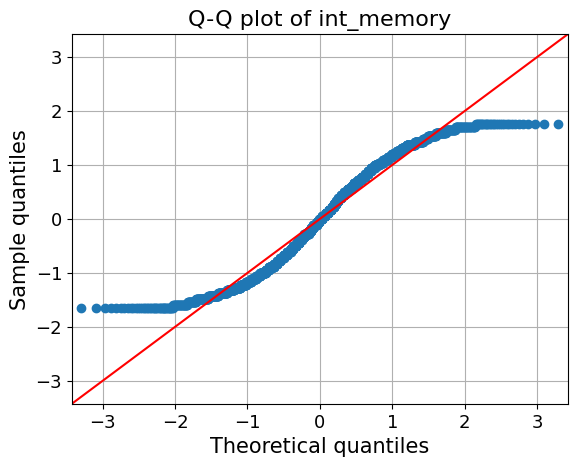

<Figure size 1600x1600 with 0 Axes>

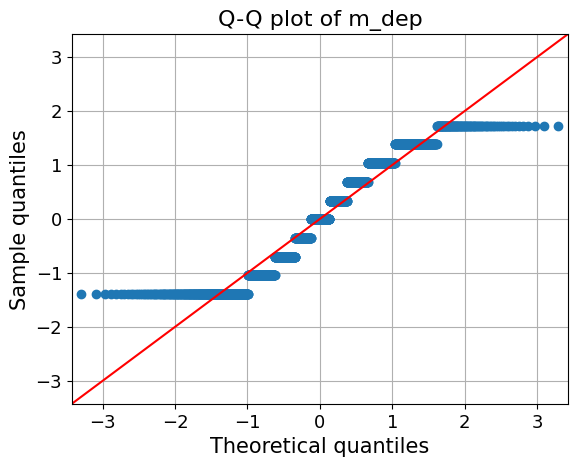

<Figure size 1600x1600 with 0 Axes>

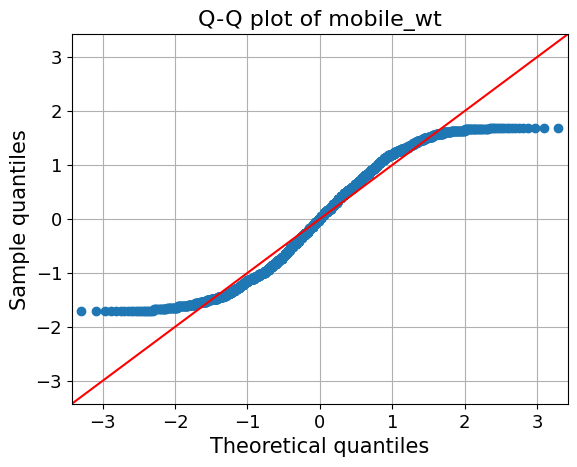

<Figure size 1600x1600 with 0 Axes>

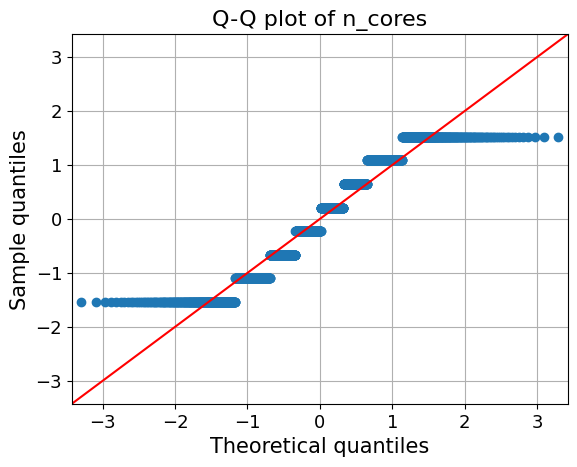

<Figure size 1600x1600 with 0 Axes>

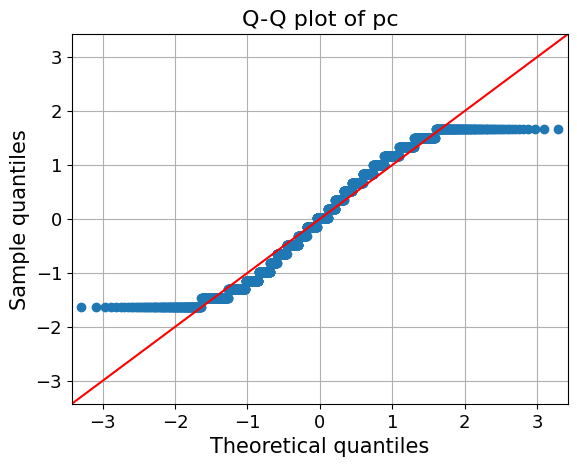

<Figure size 1600x1600 with 0 Axes>

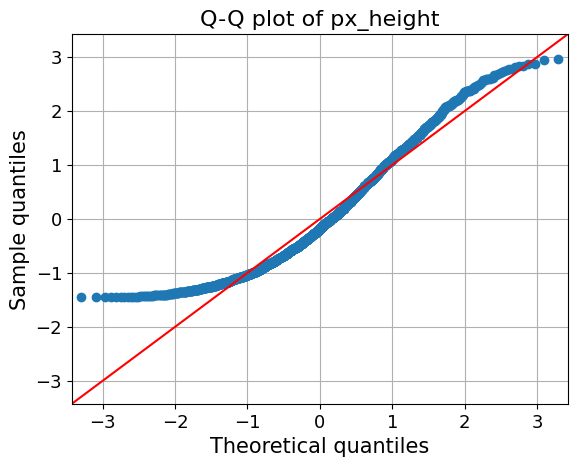

<Figure size 1600x1600 with 0 Axes>

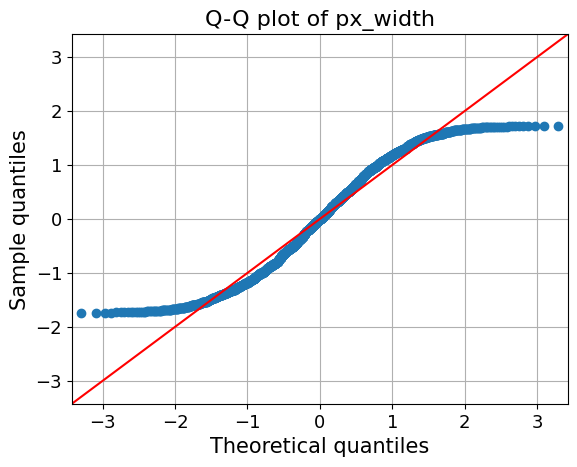

<Figure size 1600x1600 with 0 Axes>

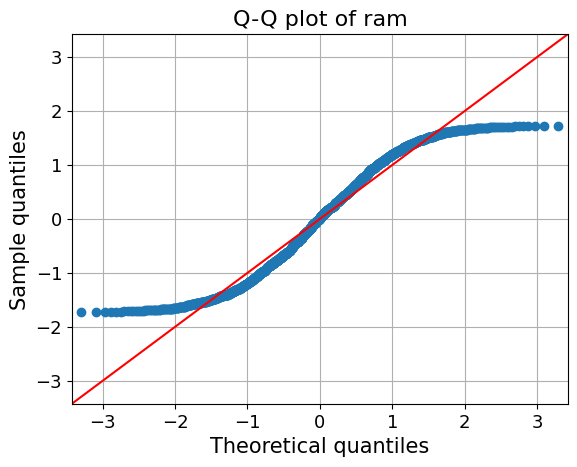

<Figure size 1600x1600 with 0 Axes>

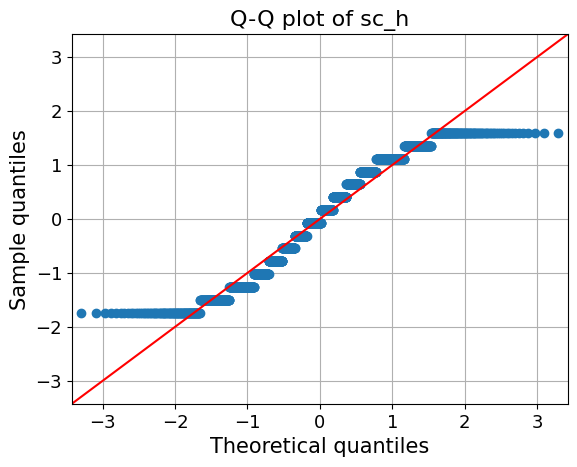

<Figure size 1600x1600 with 0 Axes>

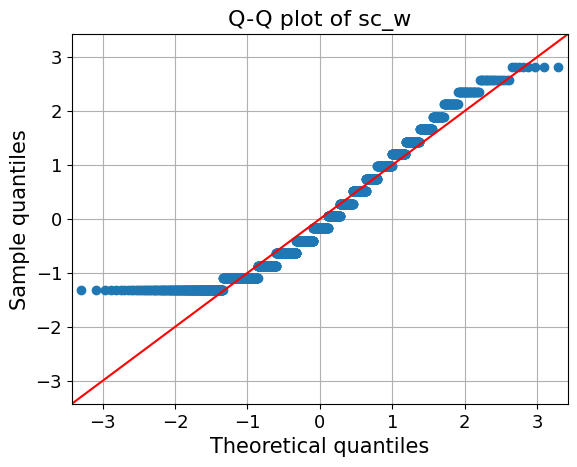

<Figure size 1600x1600 with 0 Axes>

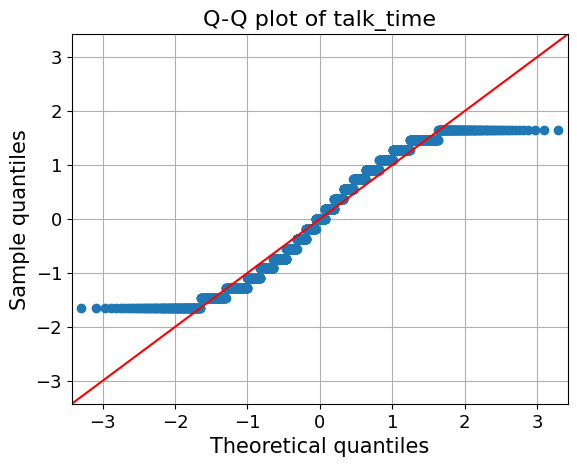

In [ ]:
#Creating a qq plot for the numeric variables to check their normal distribution.

data_norm=df_train[['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 
                'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(16,16))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

As we can see from the above plots, the numeric variables are roughly following the normal distribution, which an exception of some outliers, like clock_speed ,and fc.

# Checking which independent variables are useful to predict a target/dependent variable

**Correlation Matrix**

<Axes: >

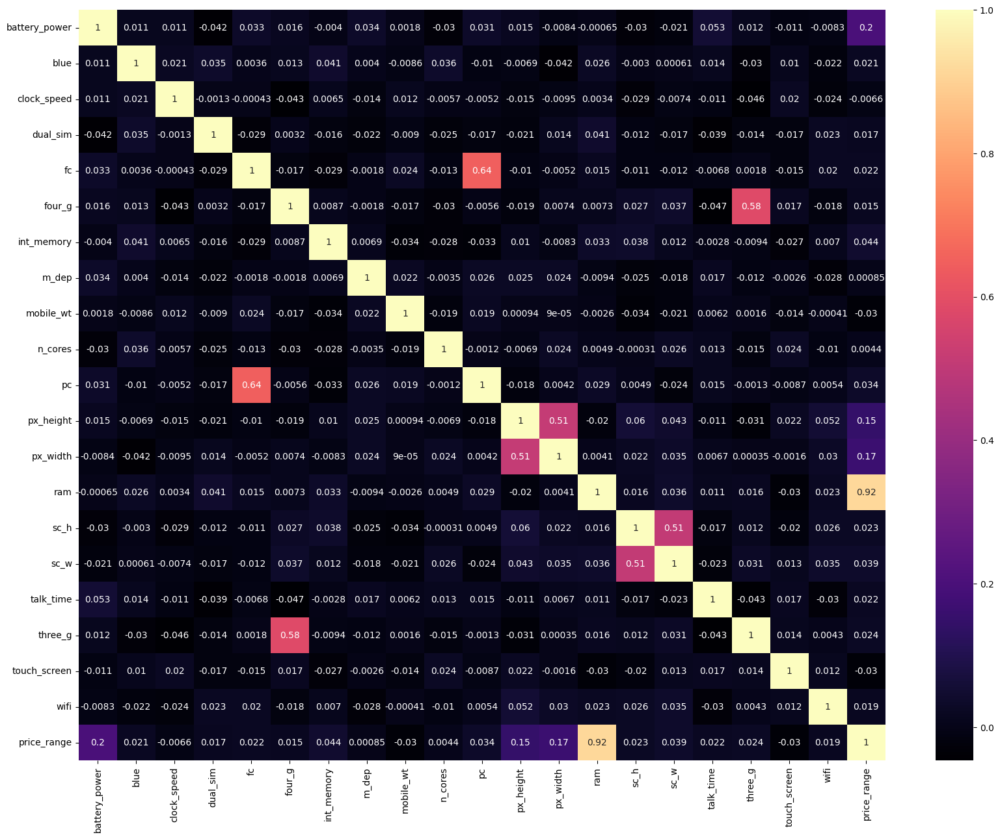

In [ ]:
# Calculate the correlation matrix
corr_matrix = df_train.corr()
plt.figure(figsize =(20, 15))
# Plot the correlation matrix using Seaborn's heatmap
sns.heatmap(corr_matrix, annot=True, cmap='magma')

Since price_range is the target variable in our dataset. Looking at the above heatmap for the correlation matrix, we can say that ram is the most important independent variable that can be used to predict the target variable.

**Random Forest**

In [ ]:
# Separate the target (dependent) variable
X = df_train.iloc[:,:-1]
y = df_train.iloc[:,-1]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Train the random forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=0)
clf.fit(X_train, y_train)

# Get the feature importances from the classifier
importances = clf.feature_importances_

# Sort the feature importances in descending order
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

Feature ranking:
1. feature 13 (0.479762)
2. feature 0 (0.075640)
3. feature 12 (0.056920)
4. feature 11 (0.056710)
5. feature 8 (0.039629)
6. feature 6 (0.035723)
7. feature 16 (0.030314)
8. feature 2 (0.029414)
9. feature 10 (0.029307)
10. feature 14 (0.028000)
11. feature 15 (0.027885)
12. feature 9 (0.024208)
13. feature 7 (0.024065)
14. feature 4 (0.023834)
15. feature 18 (0.007247)
16. feature 1 (0.006904)
17. feature 3 (0.006745)
18. feature 5 (0.006348)
19. feature 19 (0.006243)
20. feature 17 (0.005103)


Looking at the above result, we can say that ram is the most important variable to be used to predict the target variable.

# Which independent variables have missing data? How much?

In [ ]:
missing = df_train.isnull().sum().sort_values(ascending = False)
missing = missing[missing > 0]
print(missing)

Series([], dtype: int64)


Looking at the result, we can say that no independent variables are missing any data.

# Do the training and test sets have the same data?

In [ ]:
random_train = df_train.iloc[:,:-1]

# Check the number of rows and columns
if df_train.shape[0] != df_test.shape[0] or random_train.shape[1] != df_test.shape[1]:
    print("Training and test sets have different number of rows or columns")

# Check the values of each column
for col in random_train.columns:
    if not (random_train[col].equals(df_test[col])):
        print("Column " + col + " has different values in training and test sets")

Training and test sets have different number of rows or columns
Column battery_power has different values in training and test sets
Column blue has different values in training and test sets
Column clock_speed has different values in training and test sets
Column dual_sim has different values in training and test sets
Column fc has different values in training and test sets
Column four_g has different values in training and test sets
Column int_memory has different values in training and test sets
Column m_dep has different values in training and test sets
Column mobile_wt has different values in training and test sets
Column n_cores has different values in training and test sets
Column pc has different values in training and test sets
Column px_height has different values in training and test sets
Column px_width has different values in training and test sets
Column ram has different values in training and test sets
Column sc_h has different values in training and test sets
Column sc_

Thus, we can say that the train and the test sets do not have the same data.

# Are the predictor variables independent of all the other predictor variables?

<Axes: >

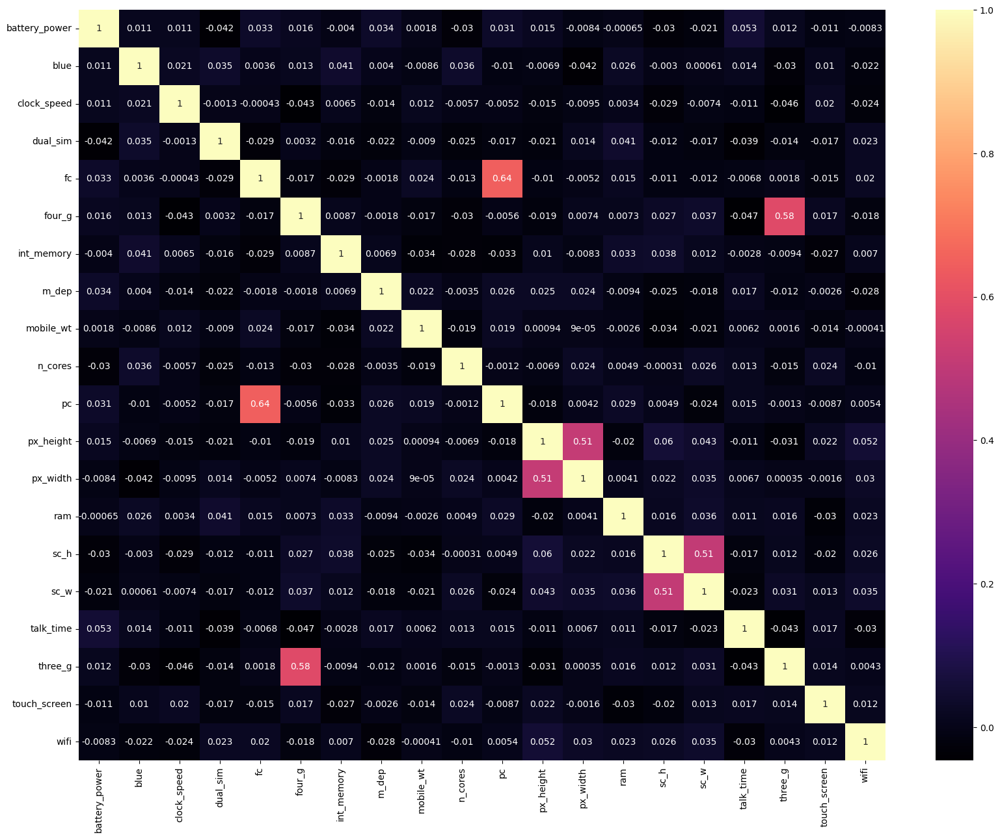

In [ ]:
X = df_train.iloc[:,:-1]
# Calculate the correlation matrix
corr_matrix = X.corr()
plt.figure(figsize =(20, 15))
# Plot the correlation matrix using Seaborn's heatmap
sns.heatmap(corr_matrix, annot=True, cmap='magma')

Looking at the above result, it can be said that "fc and pc", "four_g and three_g", "px_height and px_width", and "sc_h and sc_w" are somewhat interdependent on each other.

# Which predictor variables are the most important?

**Using Random Forest Classifier**

In [ ]:
# Separate the target (dependent) variable
X = df_train.iloc[:,:-1]
y = df_train.iloc[:,-1]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Train the random forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=0)
clf.fit(X_train, y_train)

# Get the feature importances from the classifier
importances = clf.feature_importances_

# Sort the feature importances in descending order
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

Feature ranking:
1. feature 13 (0.479762)
2. feature 0 (0.075640)
3. feature 12 (0.056920)
4. feature 11 (0.056710)
5. feature 8 (0.039629)
6. feature 6 (0.035723)
7. feature 16 (0.030314)
8. feature 2 (0.029414)
9. feature 10 (0.029307)
10. feature 14 (0.028000)
11. feature 15 (0.027885)
12. feature 9 (0.024208)
13. feature 7 (0.024065)
14. feature 4 (0.023834)
15. feature 18 (0.007247)
16. feature 1 (0.006904)
17. feature 3 (0.006745)
18. feature 5 (0.006348)
19. feature 19 (0.006243)
20. feature 17 (0.005103)


Thus, it can be said that ram is the most important predictor variable.

# Do the ranges of the predictor variables make sense?

Normalizing the predictor variable values.

In [ ]:
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_train)

data_scaled = pd.DataFrame(data_scaled, columns=df_train.columns)

Using histogram to depict all predictor variable values.

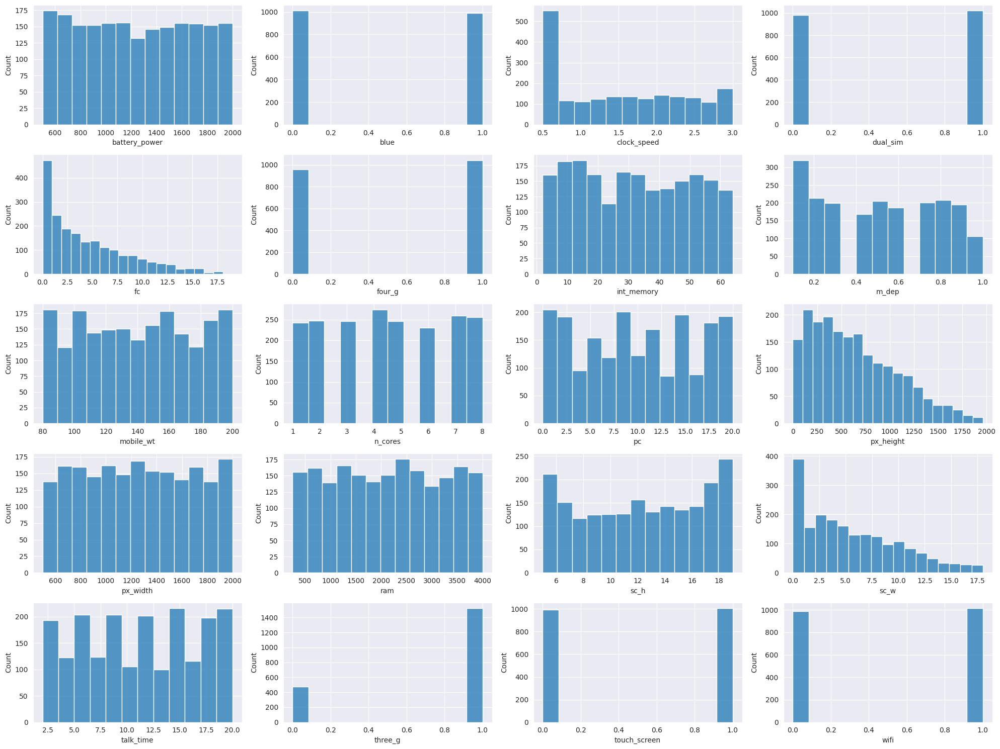

In [ ]:
sns.set_style('darkgrid')
plt.figure(figsize=(20,15))
for i in range(1, df_train.shape[1]):
    plt.subplot(5,4,i)
    sns.histplot(df_train[df_train.columns[i-1]], kde=False)
plt.tight_layout()

In the histogram above, we can see that most of the variables are normally distributed, with the exception of presence of outliers in clock_speed, m_dep, fc and sc_w, with fc, px_height and sc_w showing the trend of values grouping in the lower range. So yes, the ranges of most predictor variables makes sense.

# Distribution of the predictor variables.

In the histogram above, we can see that most of the variables are normally distributed, with the exception of presence of outliers in clock_speed, m_dep, fc and sc_w, with fc, px_height and sc_w showing the trend of values grouping in the lower range.

# Outliers

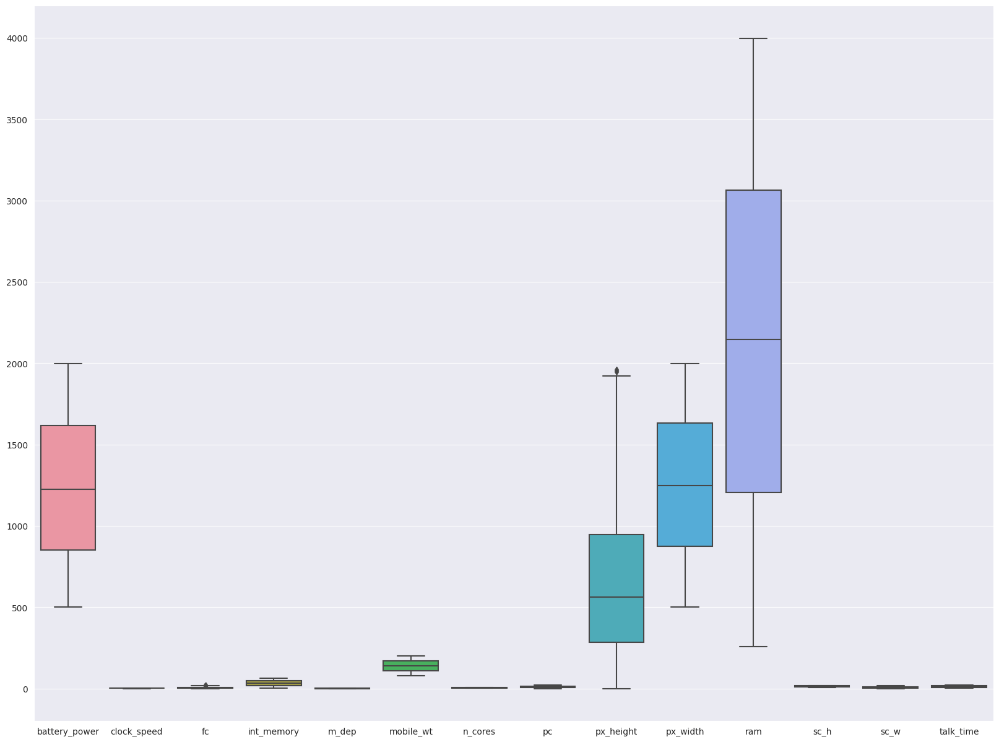

In [ ]:
# Select the specific columns for which you want to create the box plots
columns = ['battery_power','clock_speed','fc','int_memory','m_dep','mobile_wt','n_cores','pc','px_height','px_width','ram','sc_h','sc_w','talk_time']
data = df_train[columns]

# Create the box plots
plt.figure(figsize=(20,15))
sns.boxplot(data=data)
plt.show()

In the above box plot, we can see that only fc and px_height have outliers.

# Removal and Imputation of Data

**Removing 1% Data**

In [ ]:
df_copy = df_train.copy()

#removing 1% data from column 
df_one = df_copy['battery_power'].sample(frac = 0.01)

df_copy['battery_power'].loc[df_copy.index.isin(df_one.index)]=np.NaN


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Count of Null Values

In [ ]:
df_copy['battery_power'].isnull().sum()

20

Data Entry using Mode Imputation

In [ ]:
df_copy['battery_power'] = df_copy['battery_power'].fillna(df_copy['battery_power'].mode())

In [ ]:
df_copy = df_copy.apply(LabelEncoder().fit_transform)
df_copy

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,255,0,17,0,1,0,5,5,108,1,...,18,186,963,4,7,17,0,0,1,1
1,382,1,0,1,0,1,51,6,56,2,...,738,1099,998,12,3,5,1,1,0,2
2,48,1,0,1,2,1,39,8,65,4,...,962,901,984,6,2,7,1,1,0,2
3,88,1,20,0,0,0,8,7,51,5,...,935,954,1055,11,8,9,1,0,0,2
4,949,1,7,0,13,1,42,5,61,1,...,928,517,499,3,2,13,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,216,1,0,1,0,1,0,7,26,5,...,939,1022,180,8,4,17,1,1,0,0
1996,1057,1,21,1,0,0,37,1,107,3,...,745,1080,732,6,10,14,1,1,1,2
1997,1020,0,4,1,1,1,34,6,28,7,...,716,834,1158,4,1,3,1,1,0,3
1998,728,0,4,0,4,1,44,0,65,4,...,283,120,266,13,10,17,1,1,1,0


In [ ]:
X = df_copy.drop(['price_range'], axis =1)
y = df_copy['price_range']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=30)

In [ ]:
clf = RandomForestClassifier(random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
# Make predictions using the training set
y_pred = clf.predict(X_train)
# The mean squared error
print('Root Mean squared error: %.2f'% math.sqrt(mean_squared_error(y_train, y_pred)))

r2 = r2_score(y_train,y_pred)
print('R^2 score on tarining set =',r2)

Root Mean squared error: 0.00
R^2 score on tarining set = 1.0


In [ ]:
# Make predictions using the testing set
y_pred = clf.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% math.sqrt(mean_squared_error(y_test, y_pred)))

r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.37
R^2 score on test set = 0.8934152091671692


**Removing 5% data**

In [ ]:
df_copy = df_train.copy()

X = df_copy.drop(['price_range'], axis =1)
y = df_copy['price_range']

#removing 5% data from column 
df_five = df_copy['battery_power'].sample(frac = 0.05)

df_copy['battery_power'].loc[df_copy.index.isin(df_five.index)]=np.NaN


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Count of Null values

In [ ]:
df_copy['battery_power'].isnull().sum()

100

Data Entry using Median Imputation

In [ ]:
df_copy['battery_power'] = df_copy['battery_power'].fillna(df_copy['battery_power'].median())

In [ ]:
df_copy = df_copy.apply(LabelEncoder().fit_transform)
df_copy

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,249,0,17,0,1,0,5,5,108,1,...,18,186,963,4,7,17,0,0,1,1
1,371,1,0,1,0,1,51,6,56,2,...,738,1099,998,12,3,5,1,1,0,2
2,522,1,0,1,2,1,39,8,65,4,...,962,901,984,6,2,7,1,1,0,2
3,87,1,20,0,0,0,8,7,51,5,...,935,954,1055,11,8,9,1,0,0,2
4,936,1,7,0,13,1,42,5,61,1,...,928,517,499,3,2,13,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,212,1,0,1,0,1,0,7,26,5,...,939,1022,180,8,4,17,1,1,0,0
1996,1042,1,21,1,0,0,37,1,107,3,...,745,1080,732,6,10,14,1,1,1,2
1997,1007,0,4,1,1,1,34,6,28,7,...,716,834,1158,4,1,3,1,1,0,3
1998,718,0,4,0,4,1,44,0,65,4,...,283,120,266,13,10,17,1,1,1,0


In [ ]:
X = df_copy.drop(['price_range'], axis =1)
y = df_copy['price_range']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=30)

clf = RandomForestClassifier(random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
# Make predictions using the training set
y_pred = clf.predict(X_train)
# The mean squared error
print('Root Mean squared error: %.2f'% math.sqrt(mean_squared_error(y_train, y_pred)))

r2 = r2_score(y_train,y_pred)
print('R^2 score on tarining set =',r2)

Root Mean squared error: 0.00
R^2 score on tarining set = 1.0


In [ ]:
# Make predictions using the testing set
y_pred = clf.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% math.sqrt(mean_squared_error(y_test, y_pred)))

r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.38
R^2 score on test set = 0.8842041778606283


**Removing 10% Data**

In [ ]:
df_copy = df_train.copy()

#removing 10% data from column 
df_ten = df_copy['battery_power'].sample(frac = 0.1)

df_copy['battery_power'].loc[df_copy.index.isin(df_ten.index)]=np.NaN


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Count of Null Values

In [ ]:
df_copy['battery_power'].isnull().sum()

200

Data Entry using Mean Imputation

In [ ]:
df_copy['battery_power'] = df_copy['battery_power'].fillna(df_copy['battery_power'].mean())

In [ ]:
df_copy = df_copy.apply(LabelEncoder().fit_transform)
df_copy

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,239,0,17,0,1,0,5,5,108,1,...,18,186,963,4,7,17,0,0,1,1
1,356,1,0,1,0,1,51,6,56,2,...,738,1099,998,12,3,5,1,1,0,2
2,46,1,0,1,2,1,39,8,65,4,...,962,901,984,6,2,7,1,1,0,2
3,514,1,20,0,0,0,8,7,51,5,...,935,954,1055,11,8,9,1,0,0,2
4,902,1,7,0,13,1,42,5,61,1,...,928,517,499,3,2,13,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,201,1,0,1,0,1,0,7,26,5,...,939,1022,180,8,4,17,1,1,0,0
1996,1006,1,21,1,0,0,37,1,107,3,...,745,1080,732,6,10,14,1,1,1,2
1997,973,0,4,1,1,1,34,6,28,7,...,716,834,1158,4,1,3,1,1,0,3
1998,693,0,4,0,4,1,44,0,65,4,...,283,120,266,13,10,17,1,1,1,0


In [ ]:
X = df_copy.drop(['price_range'], axis =1)
y = df_copy['price_range']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=30)

clf = RandomForestClassifier(random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
# Make predictions using the training set
y_pred = clf.predict(X_train)
# The mean squared error
print('Root Mean squared error: %.2f'% math.sqrt(mean_squared_error(y_train, y_pred)))

r2 = r2_score(y_train,y_pred)
print('R^2 score on tarining set =',r2)

Root Mean squared error: 0.00
R^2 score on tarining set = 1.0


In [ ]:
# Make predictions using the testing set
y_pred = clf.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% math.sqrt(mean_squared_error(y_test, y_pred)))

r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.38
R^2 score on test set = 0.8868359010910686


Looking at the loss, bias and the variance after removal and imputation of 1%, 5%, 10% data, we can see that there is not a significant affect on the model, as the r-squared value remains close to 1. So we can say that the imputation methods did a good job at recovering the missing data.

# Accuracy and a confusion matrix for Categorical Data

In [ ]:
# Select specific columns to use for prediction
selected_columns = ['blue', 'dual_sim', 'four_g','three_g','touch_screen','wifi']
df_selected = df_train[selected_columns]

# Split data into training and test set
X_train, X_test, y_train, y_test = train_test_split(
    df_selected, df_train['price_range'], test_size=0.3, random_state=0)

# Train a Logistic Regression model
clf = LogisticRegression()
clf.fit(X_train, y_train)

# Predict the target values for test data
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy
print("Accuracy:", accuracy)

Accuracy: 0.23


In [ ]:
# Select the specific columns you want to calculate the confusion matrix for
columns = ['blue', 'dual_sim', 'four_g','three_g','touch_screen','wifi']
df = df_train[columns]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    df_selected, df_train['price_range'], test_size=0.3, random_state=0)

# Train a classifier on the training data
clf = LogisticRegression()
clf.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = clf.predict(X_test)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print the confusion matrix
print("Confusion Matrix:-")
print(cm)

Confusion Matrix:-
[[38 53 33 27]
 [43 42 31 19]
 [38 54 37 22]
 [39 65 38 21]]


Looking at the accuracy and the confusion matrix for the categorical predictor variables, we can say that the they are not that useful in predicting the target variable, as they are not very important for the prediction.

# Initializing AutoML

In [ ]:
# Converted Pandas Dataframe to H2O dataframe to proceed with AutoML
data = h2o.H2OFrame(df_train)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
#Checking H2O Dataframe Data Types
data.types

{'battery_power': 'int',
 'blue': 'int',
 'clock_speed': 'real',
 'dual_sim': 'int',
 'fc': 'int',
 'four_g': 'int',
 'int_memory': 'int',
 'm_dep': 'real',
 'mobile_wt': 'int',
 'n_cores': 'int',
 'pc': 'int',
 'px_height': 'int',
 'px_width': 'int',
 'ram': 'int',
 'sc_h': 'int',
 'sc_w': 'int',
 'talk_time': 'int',
 'three_g': 'int',
 'touch_screen': 'int',
 'wifi': 'int',
 'price_range': 'int'}

In [ ]:
# Setting up the data split between training and test dataset
pct_rows = 0.80  
data_train, data_test = data.split_frame([pct_rows])

In [ ]:
# Define the target variable and the predictor variables
y = 'price_range'
X = data.columns
X.remove(y)

In [ ]:
# Initializing AutoML
run_time = 600
aml = H2OAutoML(max_models=10, max_runtime_secs=run_time, seed=1)

In [ ]:
# Training the train data on various models
aml.train(x=X, y=y, training_frame=data_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),7/10
# GBM base models (used / total),3/4
# XGBoost base models (used / total),1/3
# DRF base models (used / total),2/2
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [ ]:
# Leaderboard showing the performance of different models on the dataset
print(aml.leaderboard)

model_id                                                    rmse        mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_1_20230410_14449     0.27371   0.0749174  0.208065  0.136032                 0.0749174
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_14449  0.274572  0.0753898  0.21094   0.137738                 0.0753898
GBM_3_AutoML_1_20230410_14449                           0.290472  0.084374   0.219082  0.147765                 0.084374
GBM_2_AutoML_1_20230410_14449                           0.294023  0.0864493  0.224863  0.147534                 0.0864493
GBM_4_AutoML_1_20230410_14449                           0.294741  0.0868724  0.224161  0.146762                 0.0868724
GBM_1_AutoML_1_20230410_14449                           0.295172  0.0871265  0.245062  0.15479                  0.0871265
XGBoost_3_AutoML_1_20230410_14449                       0.295938  0.0875793  0.222068  0.145128                 0.0875793
DRF_1_AutoML_1_20230410_1

In [ ]:
from sklearn.metrics import r2_score

# Get the leaderboard
leaderboard = aml.leaderboard

# Iterate through the models and compute R^2 scores
for i in range(leaderboard.nrows):
    model_id = leaderboard[i, "model_id"]
    model = h2o.get_model(model_id)
    predictions = model.predict(data_test).as_data_frame()
    true_values = data_test[y].as_data_frame()
    r2 = r2_score(true_values, predictions)
    print(f"Model {model_id}: R^2 score = {r2:.4f}")

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Model StackedEnsemble_AllModels_1_AutoML_1_20230410_14449: R^2 score = 0.9471
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Model StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_14449: R^2 score = 0.9468
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Model GBM_3_AutoML_1_20230410_14449: R^2 score = 0.9449
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Model GBM_2_AutoML_1_20230410_14449: R^2 score = 0.9395
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Model GBM_4_AutoML_1_20230410_14449: R^2 score = 0.9366
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Model GBM_1_AutoML_1_20230410_14449: R^2 score = 0.9392
xgboost prediction progress: |█████████████████

As we can see, that Stacked Ensemble is the model with the highest R Squared score. But we will use GBM_3_AutoML_1_20230410_14449, because it is the highest R squared model that fully supports the SHAP analysis.

# Fitting and Interpretation of the Linear Model

In [ ]:
# Split the dataset into features and target variable
X = df_train.drop("price_range", axis=1)
y = df_train["price_range"]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0
)

# Standardize the features using a StandardScaler object
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a logistic regression object and fit the model on the training data
logreg = LogisticRegression(multi_class='ovr')
logreg.fit(X_train_scaled, y_train)

LogisticRegression(multi_class='ovr')

In [ ]:
# Print the coefficients for each binary logistic regression model
for i, coef in enumerate(logreg.coef_):
    print(f"Coefficients for class {i}:")
    for feature, weight in zip(X.columns, coef):
        print(f"{feature}: {weight:.3f}")
    print("\n")

Coefficients for class 0:
battery_power: -2.111
blue: -0.067
clock_speed: 0.066
dual_sim: 0.065
fc: -0.075
four_g: -0.061
int_memory: -0.130
m_dep: -0.138
mobile_wt: 0.149
n_cores: 0.086
pc: 0.128
px_height: -1.220
px_width: -1.225
ram: -8.158
sc_h: 0.080
sc_w: 0.015
talk_time: 0.045
three_g: -0.009
touch_screen: 0.125
wifi: 0.141


Coefficients for class 1:
battery_power: 0.035
blue: 0.003
clock_speed: -0.026
dual_sim: 0.032
fc: -0.015
four_g: 0.050
int_memory: 0.028
m_dep: 0.112
mobile_wt: -0.006
n_cores: -0.184
pc: 0.056
px_height: 0.016
px_width: -0.047
ram: -0.578
sc_h: 0.028
sc_w: -0.077
talk_time: 0.057
three_g: 0.026
touch_screen: 0.024
wifi: 0.059


Coefficients for class 2:
battery_power: -0.028
blue: -0.021
clock_speed: -0.002
dual_sim: -0.072
fc: 0.043
four_g: -0.140
int_memory: -0.098
m_dep: -0.052
mobile_wt: 0.164
n_cores: 0.104
pc: 0.017
px_height: 0.026
px_width: -0.033
ram: 0.623
sc_h: -0.121
sc_w: 0.070
talk_time: -0.026
three_g: 0.066
touch_screen: -0.083
wifi: 0.017

I have used the One vs Rest method to fit logistic regression and to find the regression coefficients for each predictor variable for each class of the target variable. The Interpretation is as follows:-

Class 0 of the target variable: In class 0, we can see that many predictor variable have strong negative coefficients, which means that they are inversely related to the 0 class. The lower value these variables have, the higher probability there will be of the class being 0. battery_power, px_height, px_width, and ram are the most negatively related variables with 0 class of the price_range, meaning their higher value, in most cases, will imply the price_range not being in the 0 class. There are some positive coefficient variables, but not significant enough.

Class 1 of the target variable: Class 1 shows a mix of negative and positive coefficient variables, which means that increase in some variables might improve the probability of this class, while for some variables, it may reduce the probability. However, the most significant coefficient is the ram with a negative coefficient, which still means that increase in the ram value will decrease the probability of class 1.

Class 2 of the target variable: We can see that the most sigificant coefficient is of ram, with a positive value, which means that starting class 2, the increase in ram value will increase the probability of the class. Again, for the other variables, there is a mix of positive and negative coefficients, but with many not of much significance, so we can say that increase in some variables might increase the probability of class 3, while increase of others might decrease it.

Class 3 of the target variable: In class 3, we can see that battery_power, px_height, px_width, and ram are the variables with the most significant positive coefficients, which means that increase in their values will highly increase the probability of getting this class, the one variable with the most significant negative coefficient value is the mobile_wt, which means that increase in its value will decrease the likelihood of getting class 3.

# Fitting and Interpretation of the Tree based model

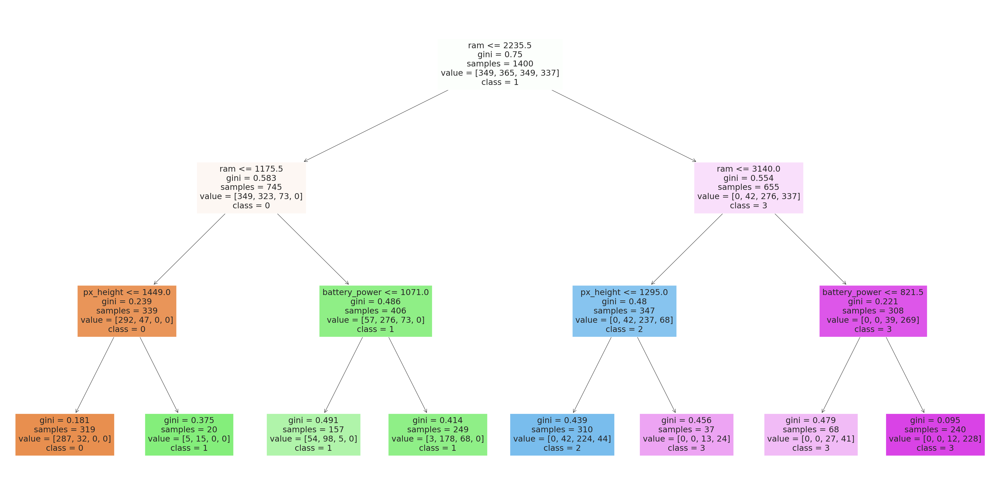

In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0
)

# Fit the decision tree classifier with max depth of 3
dtc = DecisionTreeClassifier(max_depth=3, random_state=0)
dtc.fit(X_train, y_train)

# Plot the decision tree
plt.figure(figsize=(50,25))
plot_tree(dtc, feature_names=X.columns, class_names=['0', '1', '2', '3'], filled=True)
plt.show()

Here, we see 3 levels of the decision tree classifier. The tree is split from the root node on the basis of ram.
On the first level, we see that gini of both nodes is lower than the root node gini, which is appropriate. Also, the samples are mostly evenly divided among the 2 nodes on the first level.

On the second level, we see that gini of both nodes is still lower than the root node gini, which is appropriate. Also, the samples are mostly evenly divided among the 4 nodes on the first level. Also, the second level actually contains all the classes of the target variable.

On the third level however, we see that gini score is uneven, and it even increased from the second level, which is not very good. Also, the samples are quite unevenly distributed on this level.

So overall, we can conclude that the decision tree is good uptill the second level depth.

# SHAP Analysis of the best AutoML model

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

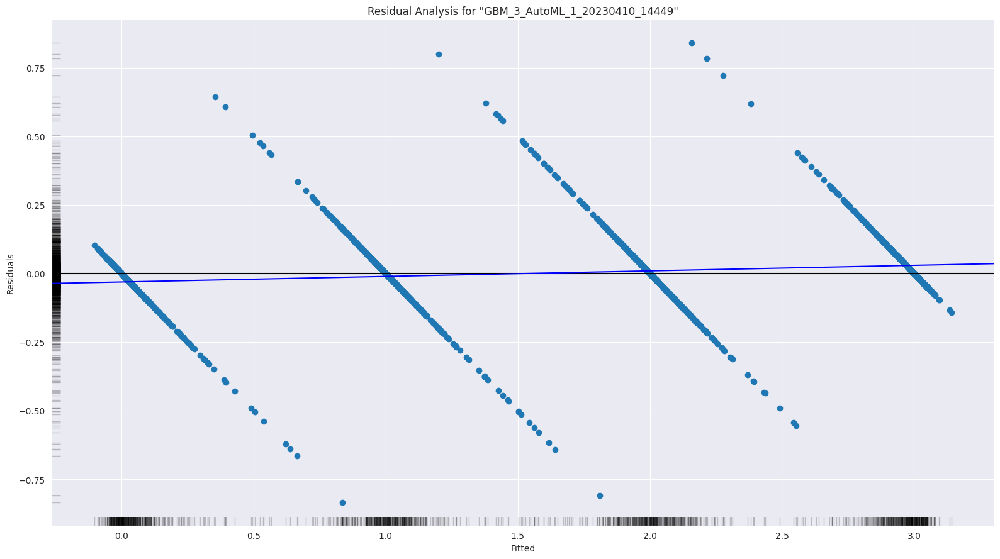

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

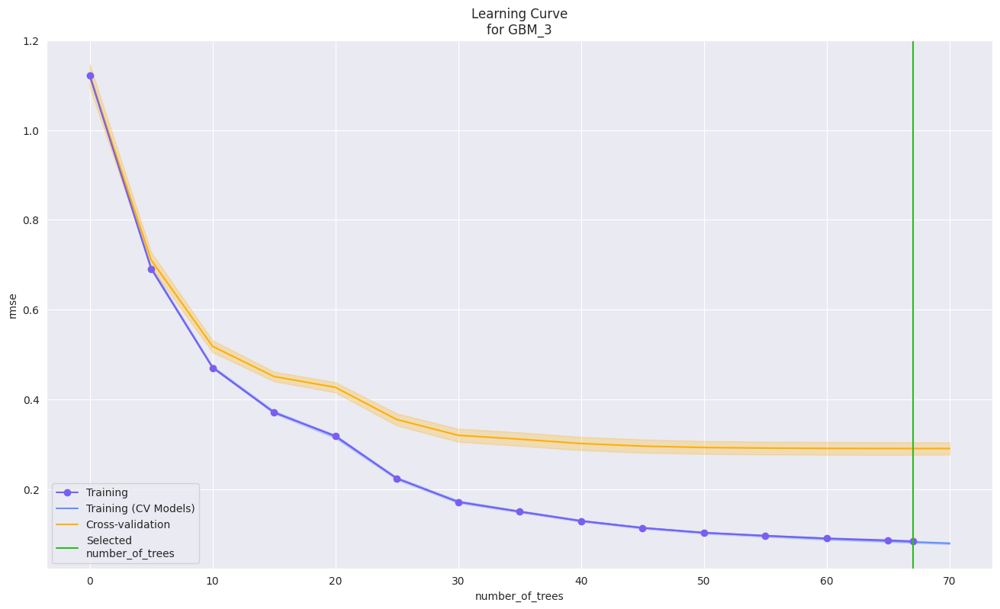

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

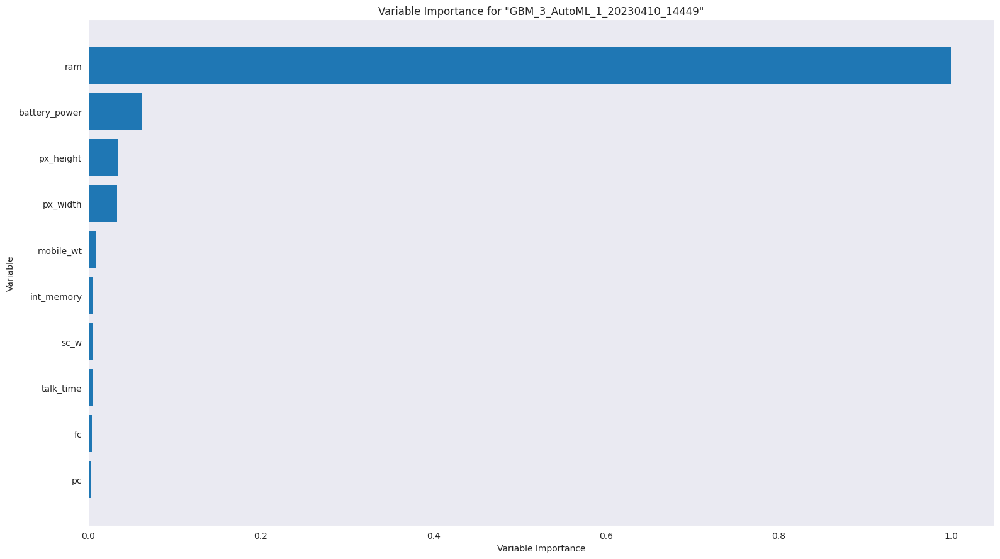

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

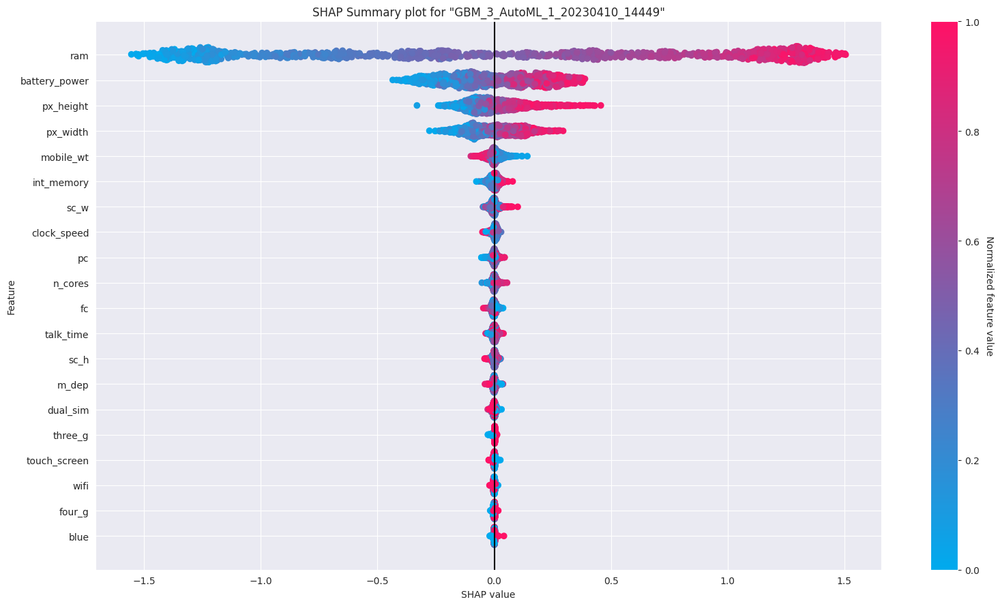

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

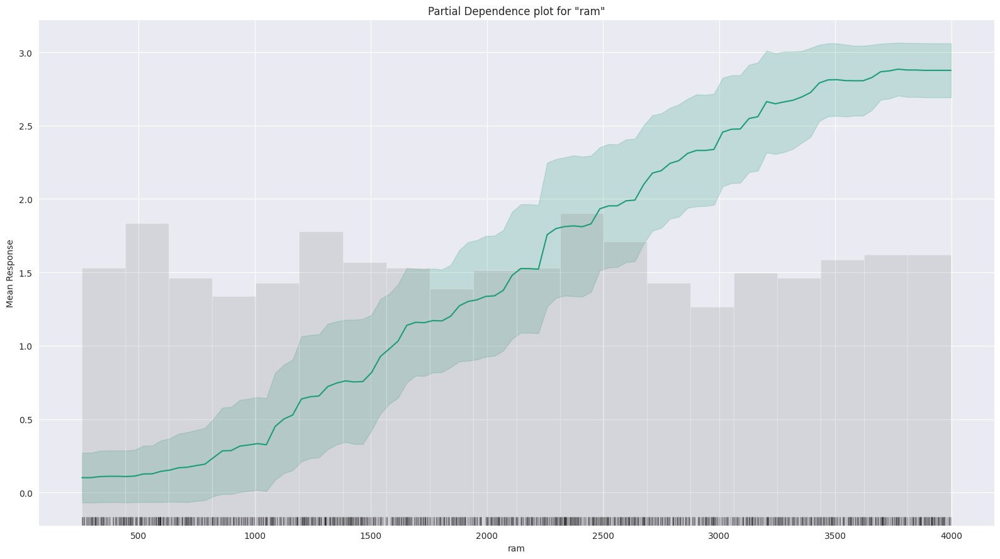

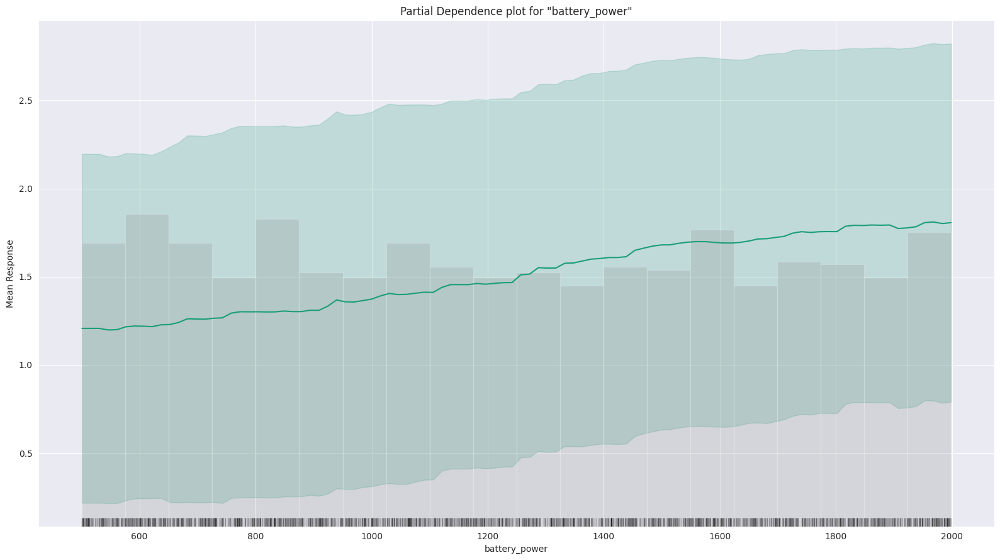

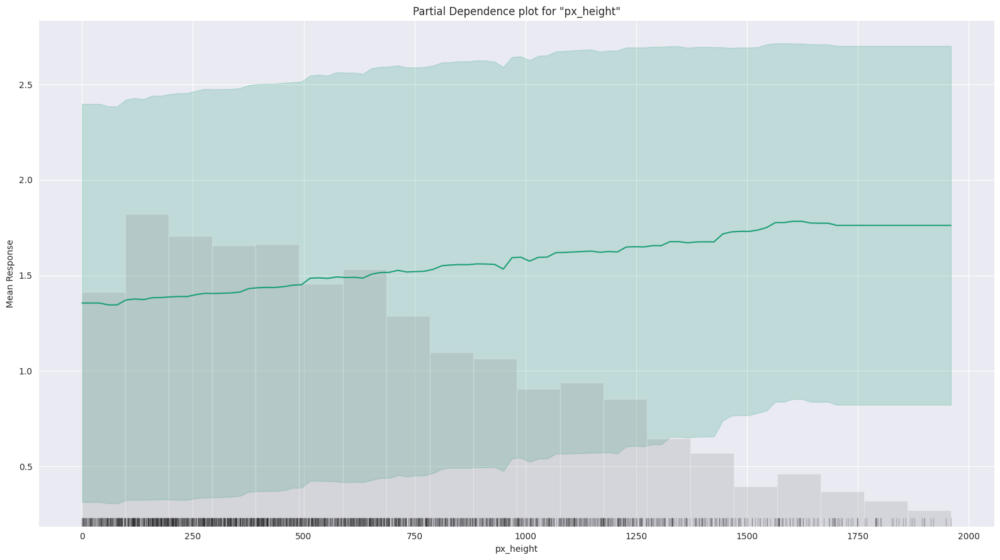

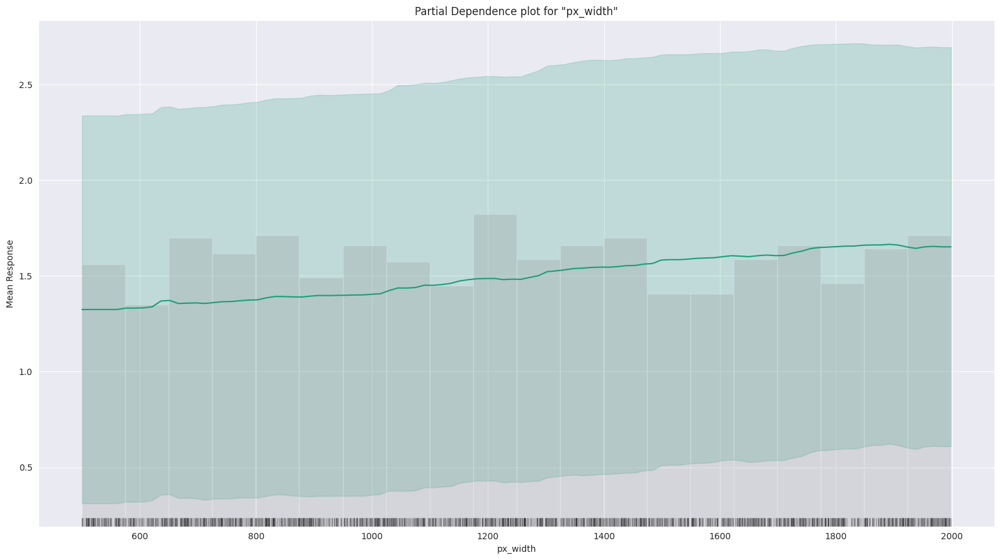

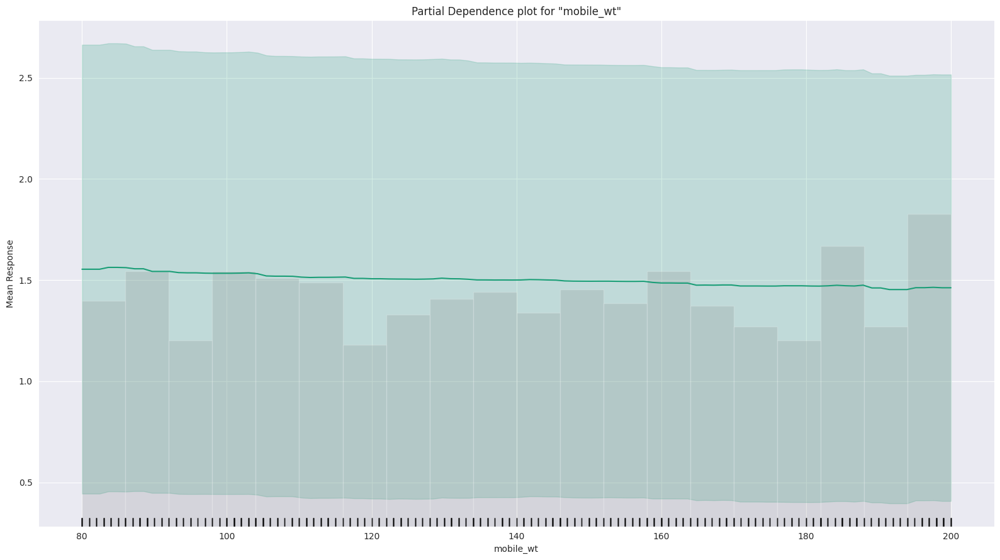

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

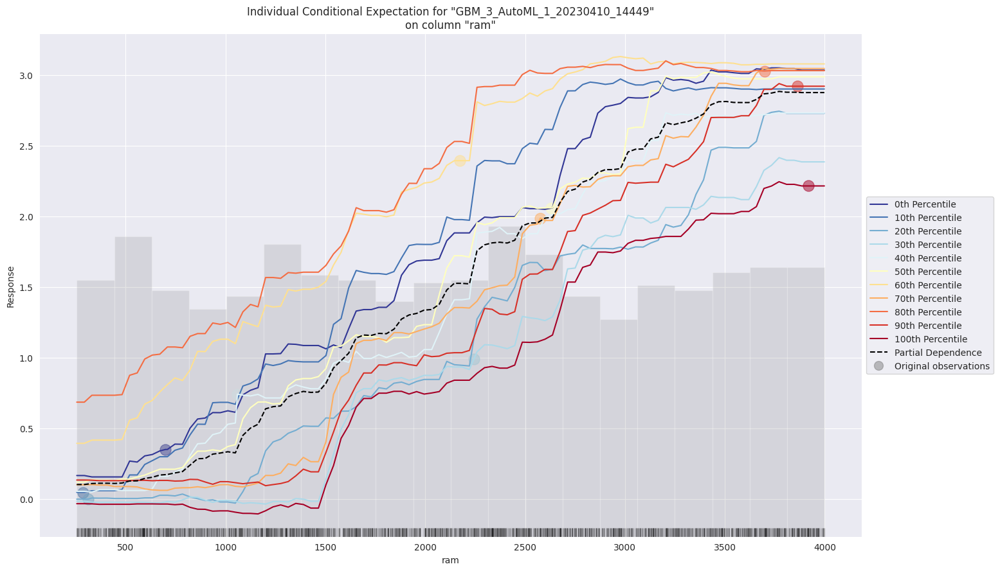

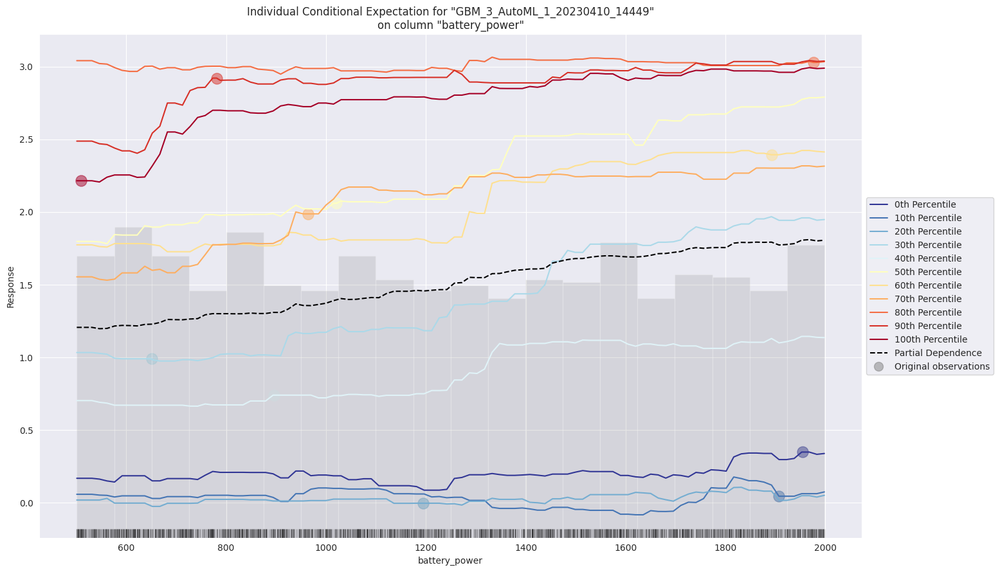

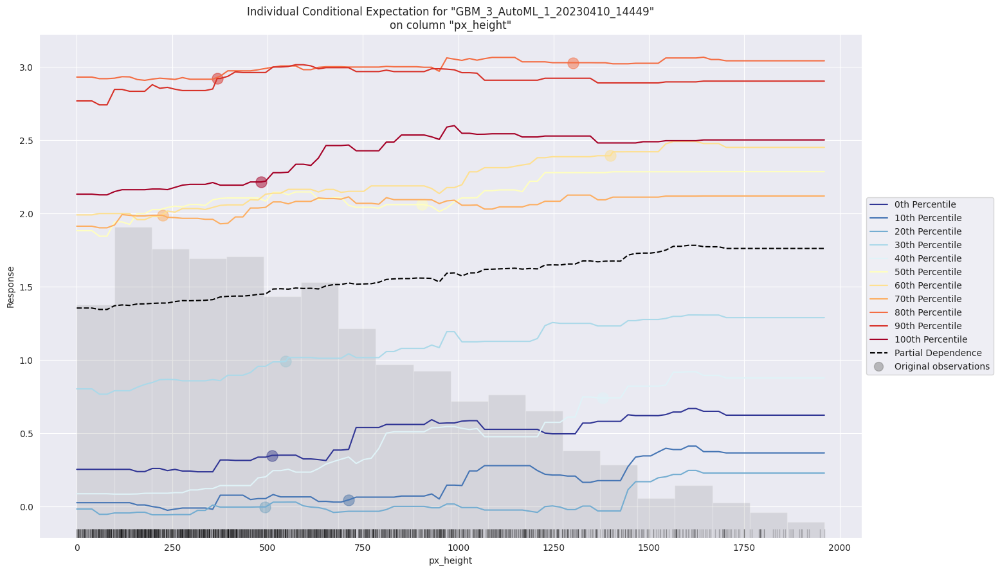

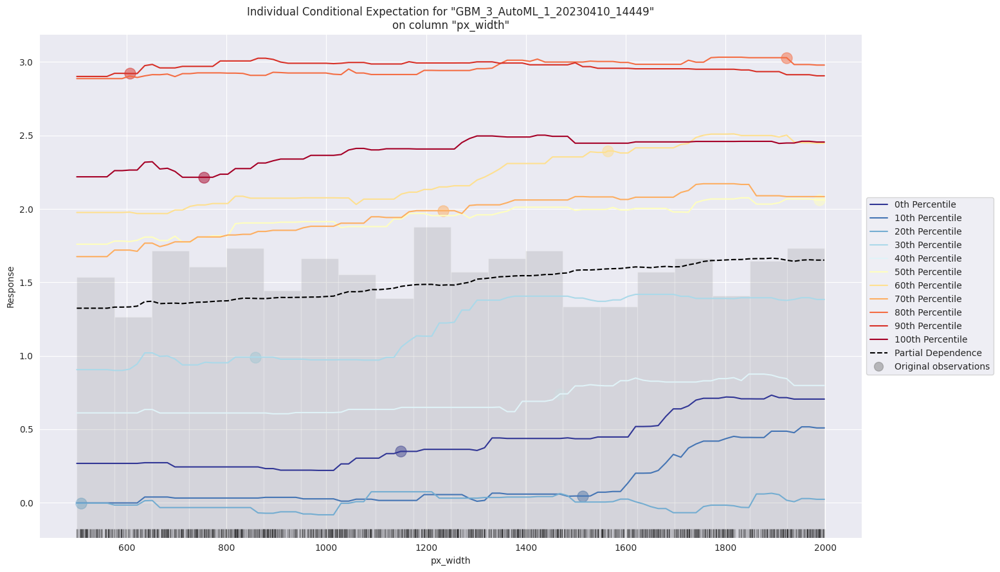

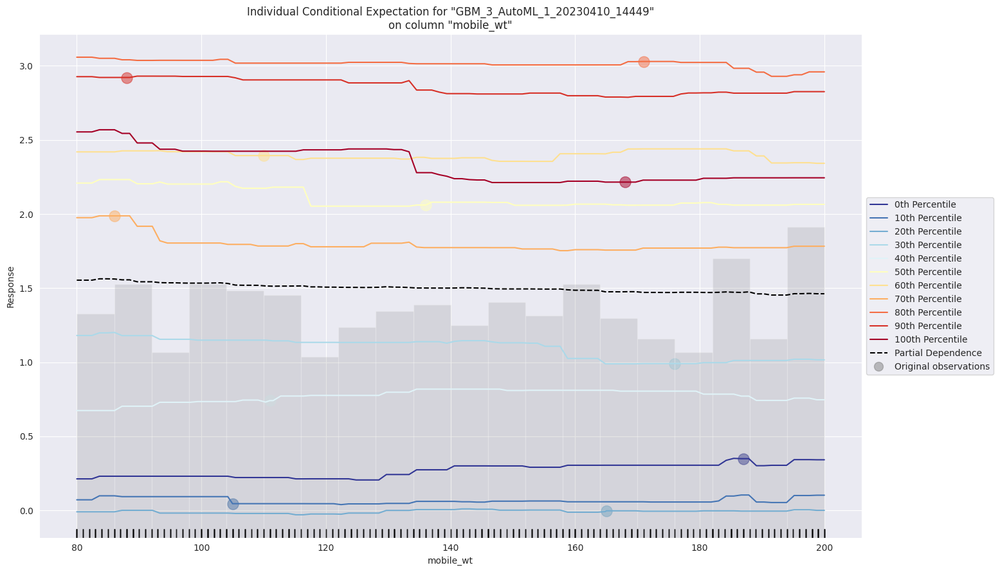

In [ ]:
# Retrieve the GBM model
model_id = "GBM_3_AutoML_1_20230410_14449"
model = h2o.get_model(model_id)

# generate SHAP values to interpret the model's predictions
shap_values = model.explain(data)

**Residual Analysis**

As we can see in our residual analysis plot, that there is the presence of some striped lines across the plot.

Striped lines may suggest that the model is better at predicting some values better than others, which could be an indication that the model needs to be improved or that there are other variables that need to be included in the model.

**Learning Curve Plot**

Based on the learning curve plot, we see that the cross validation curve has a higher mse, which suggests that the model may be well set on the training data, but not exactly performing well on new data, and so it might be overfitting.

It might be solved by adding a more complex model or introducing some new features, which might help mitigate the problem of overfitting.

**Variable Importance Plot**

As the heading of the variqable importance plot itself says, it shows the relative importance of the most important variables in the model.

And from the plot, we can see that the most important variable is ram, which means that it has the most significant impact on the likelihood of the target variale classes. AFter ram, quite a few variables are in order:-

1. ram
2. battery_power
3. px_width
4. px_height
5. clock_speed
6. talk_time
7. mobile_wt
8. n_cores
9. int_memory
10. pc

**SHAP Summary Plot**

As we can see from the shap summary plot above, we can see that the features are arranged in the order of importance from up to down.

ram, batery_power, px_width, px_height have the most spread of Shapley values, which makes them the most important features; the higher the ram/battery_power/px_width/px_height, the higher the Shapley value and therefore the higher predicted price_range class.

**Partial Dependence Plot**

The partial dependency plot shows the response of the target variable with respect to the change in the predictor variable, while keeping all the other variables constant.

Here we are gonna take a look at 2 of them, ram, and battery_power:-
1. ram: From the plot, we can see that the biggest change in the mean response happens in the range of 2500-3000. So we can interpret that this range of the predictor variable ram is the most important for the target variable.
2. battery_power: From the plot, we can see that the biggest change in the mean response happens in the range of 1200-1600. So we can interpret that this range of the predictor variable ram is the most important for the target variable.

**Individual Condition Expectation Plot**

ICE plots show us a detailed overview of the effect of predictor feature on the target, by showing it for every instance, instead of just one, like PDP.

So in our case, for ram, we saw that the big jump in response was in the range 2500-3000. But in ICE plot, we can see that some percentiles respond to that range, while others don't.

It is even more evident in the case of battery_power, which shows that almost all the percentiles are almost linear like.

So, in conclusion, we can say that ICE plots are even more important than PDP if we want to fully understand the effects of the features on the output.

# SHAP Analysis for Linear and Tree based models

**Linear Model**

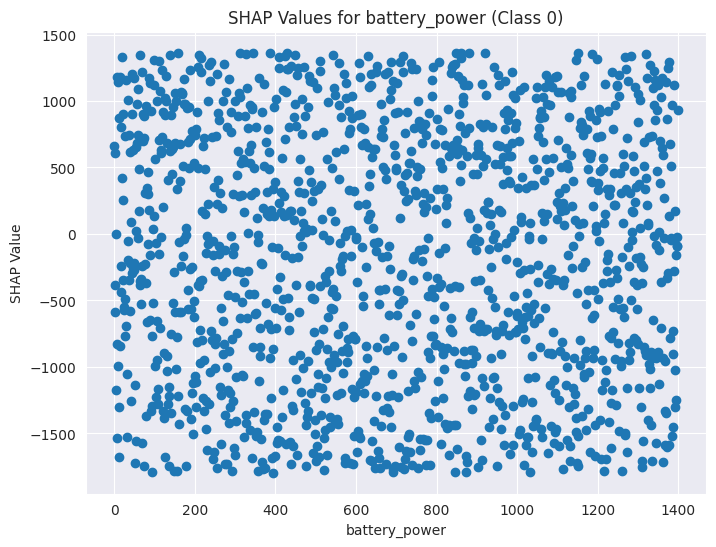

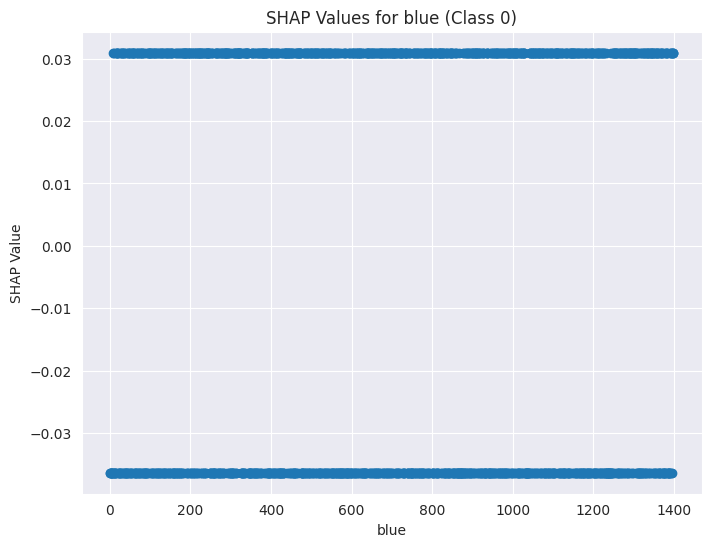

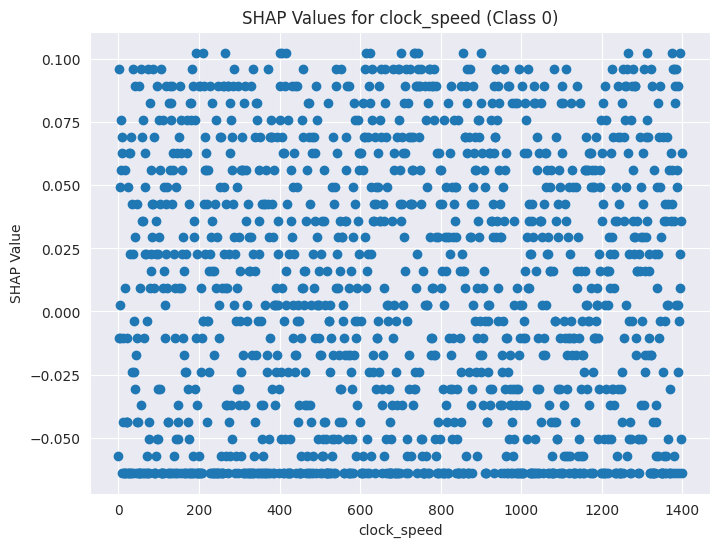

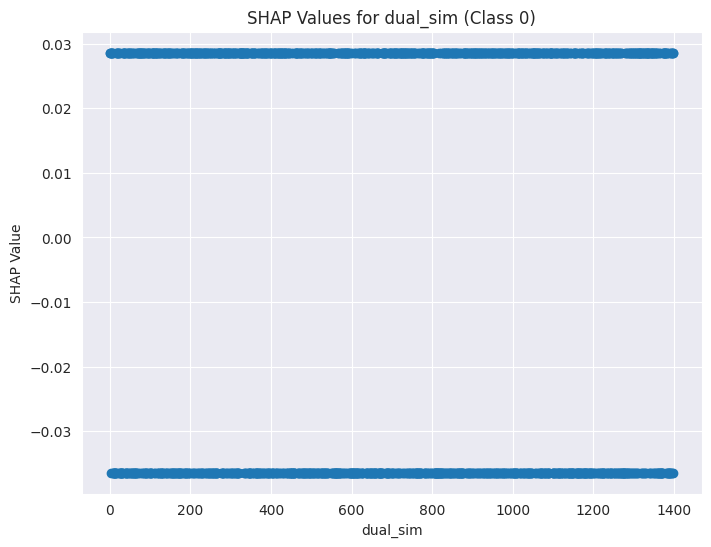

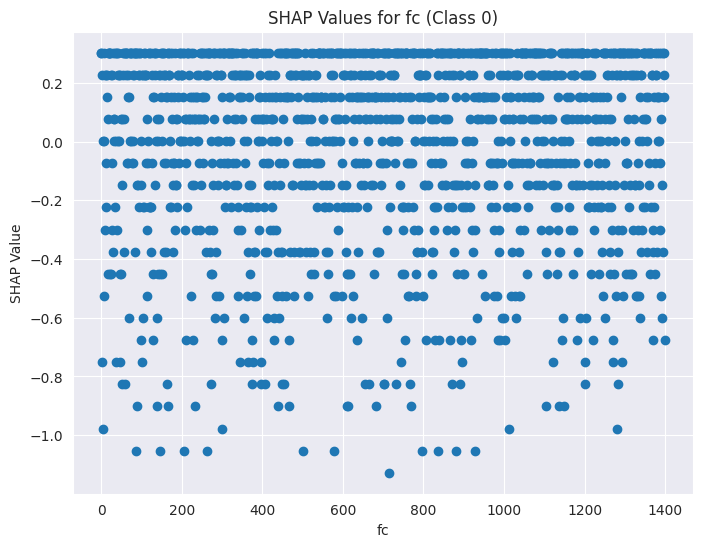

...

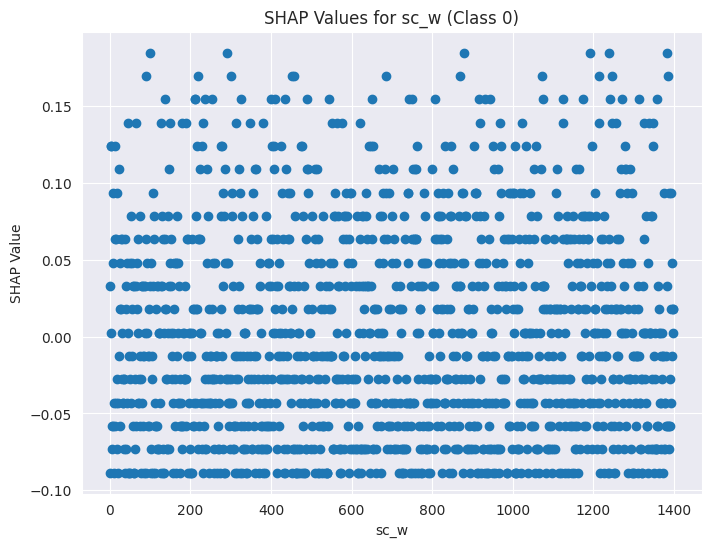

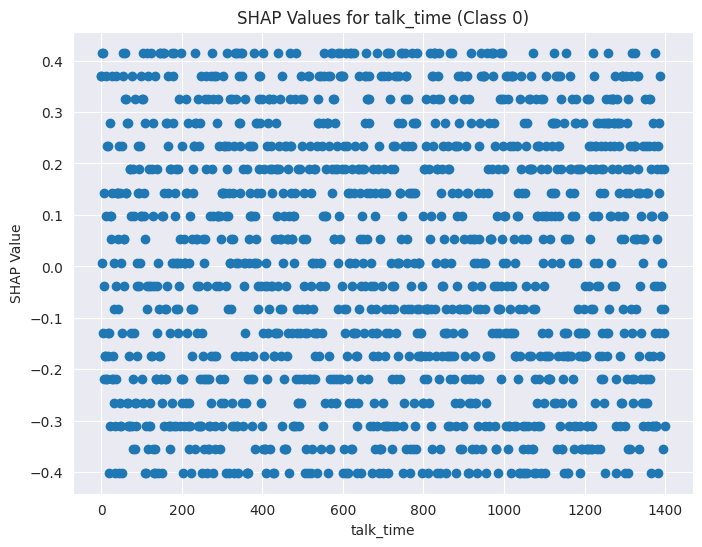

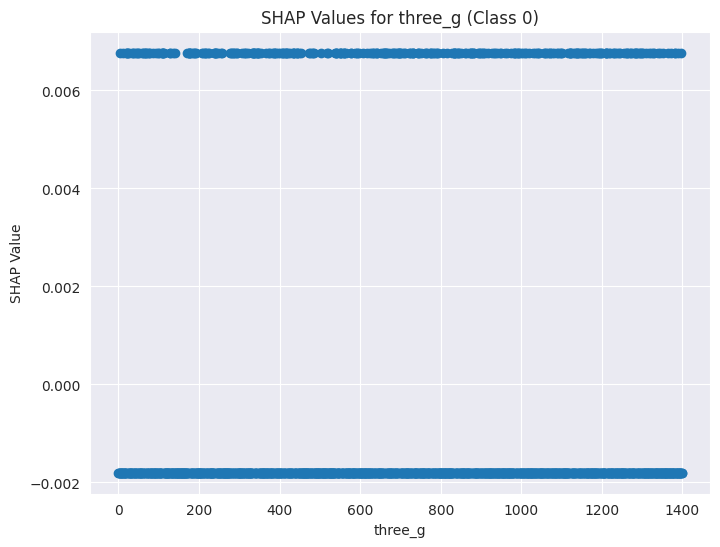

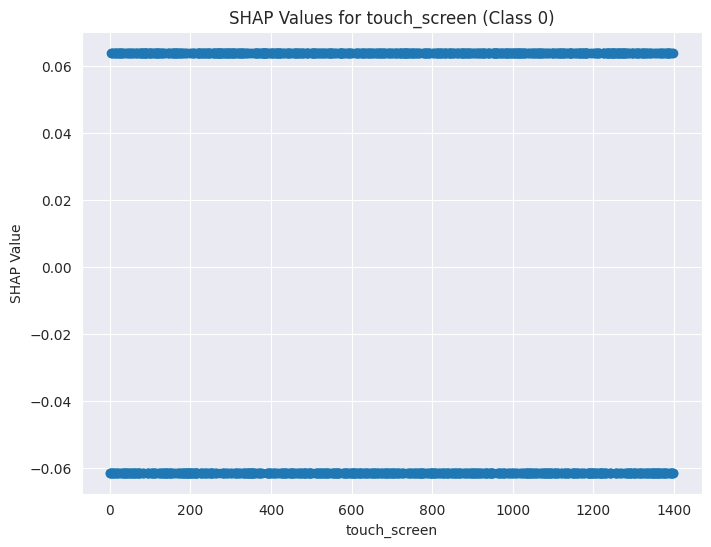

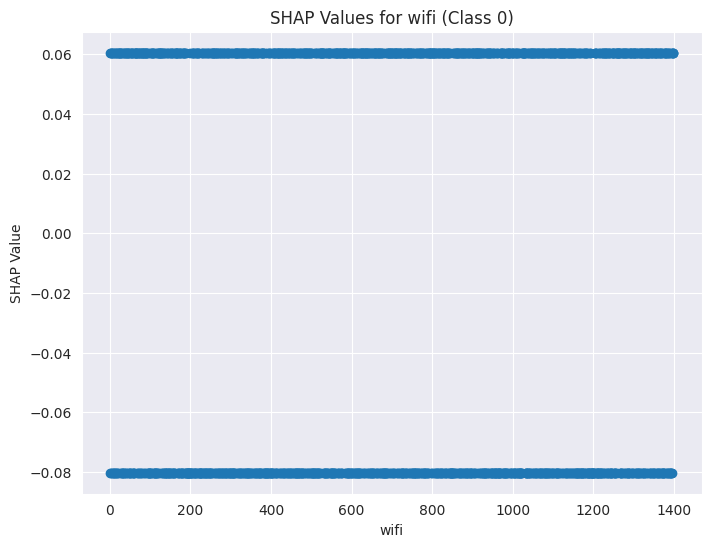

In [ ]:
import matplotlib.pyplot as plt

# SHAP explanation of a Linear Model
linear_explainer = shap.LinearExplainer(logreg, X_train)
linear_shap_values = linear_explainer(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 0

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), linear_shap_values.values[:, i, class_index])
    plt.xlabel(feature_name)
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

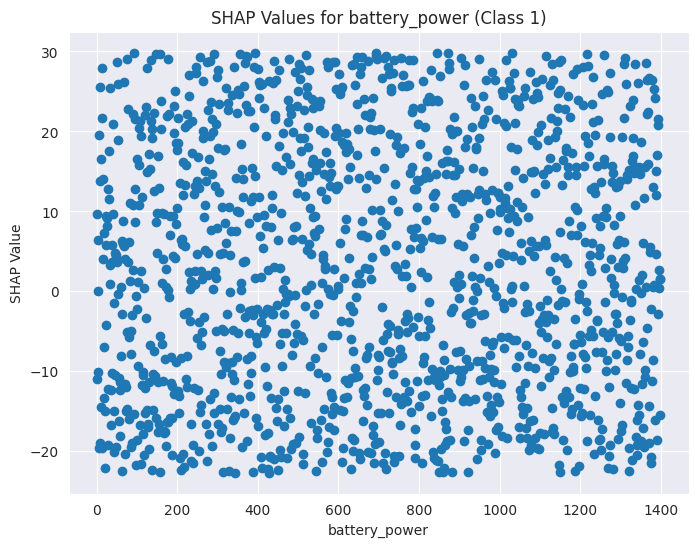

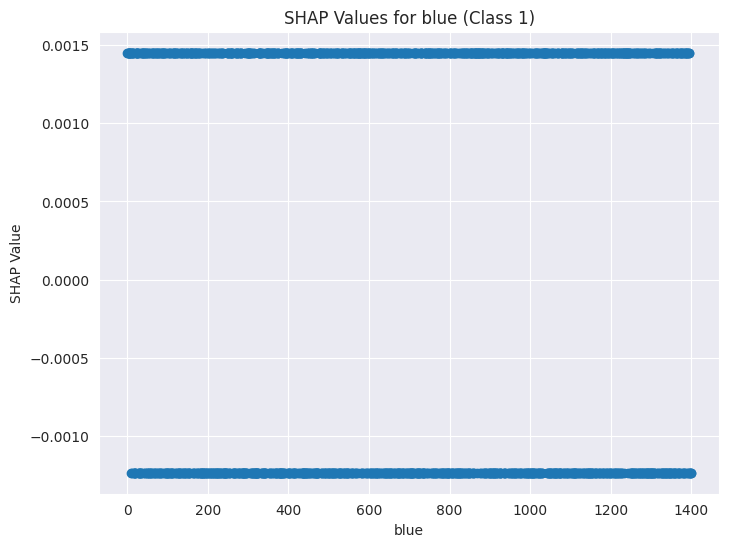

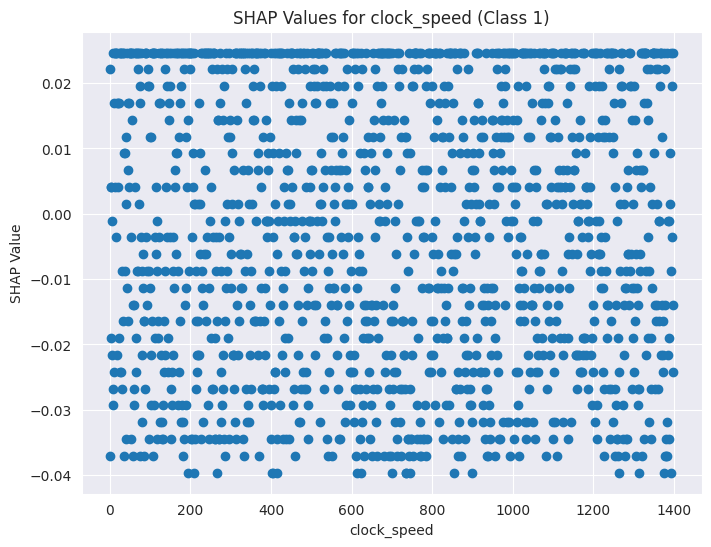

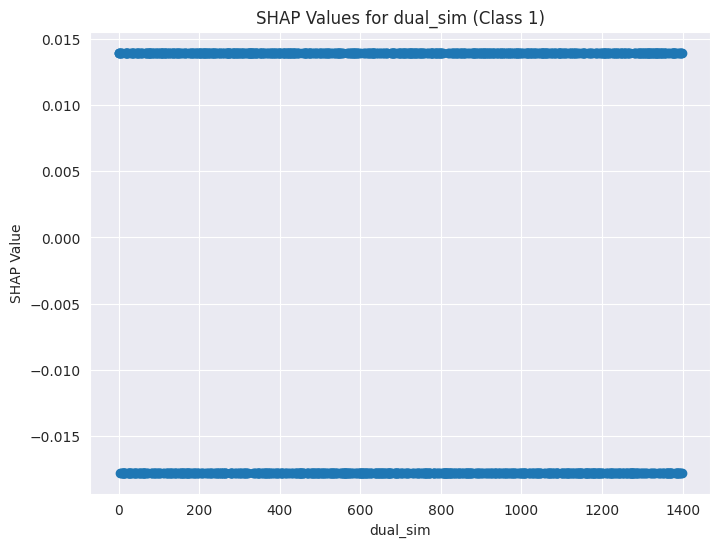

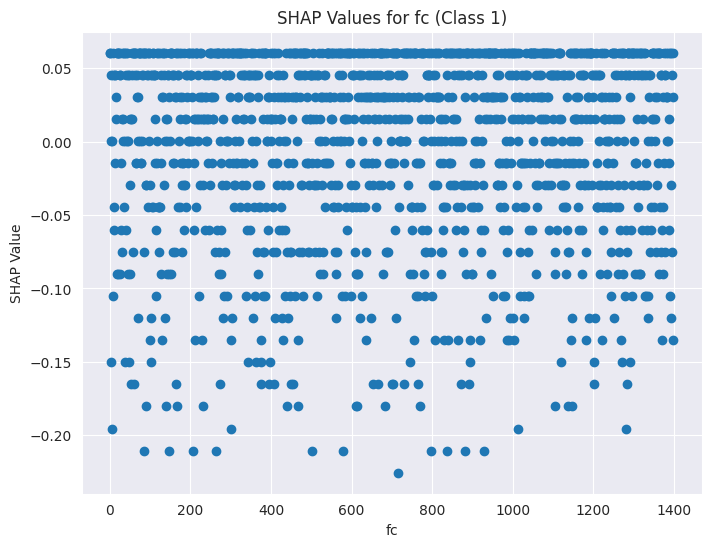

...

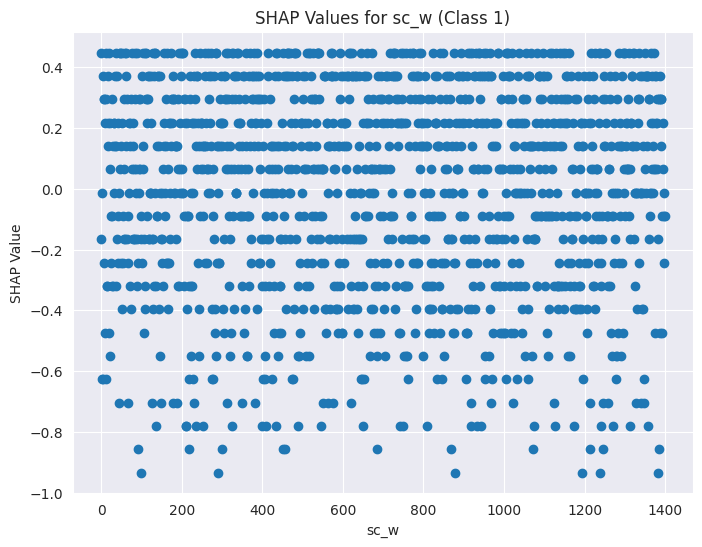

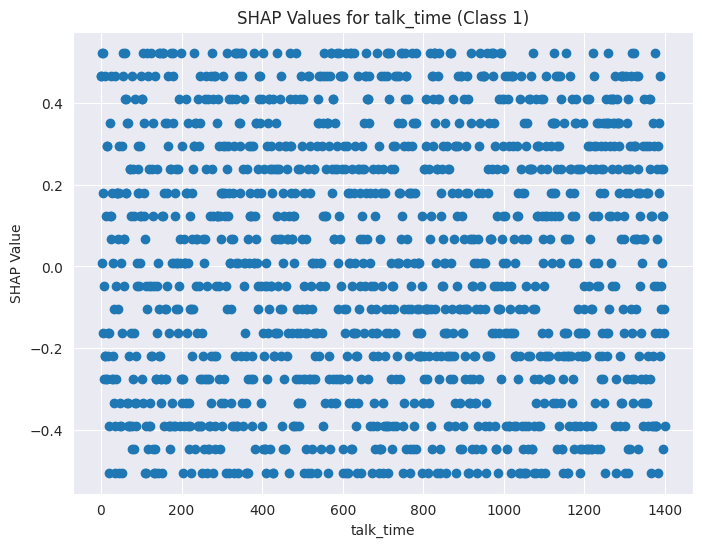

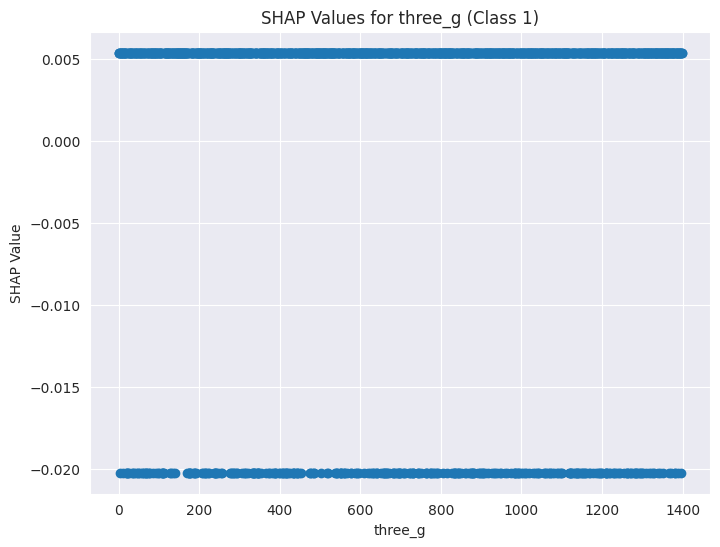

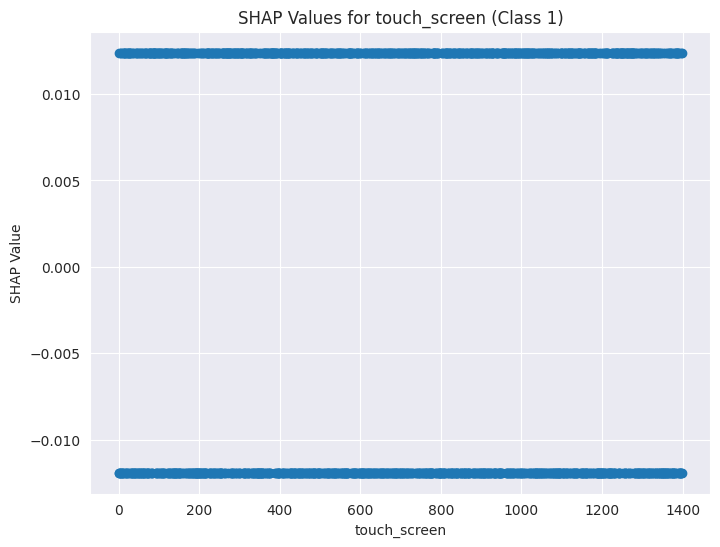

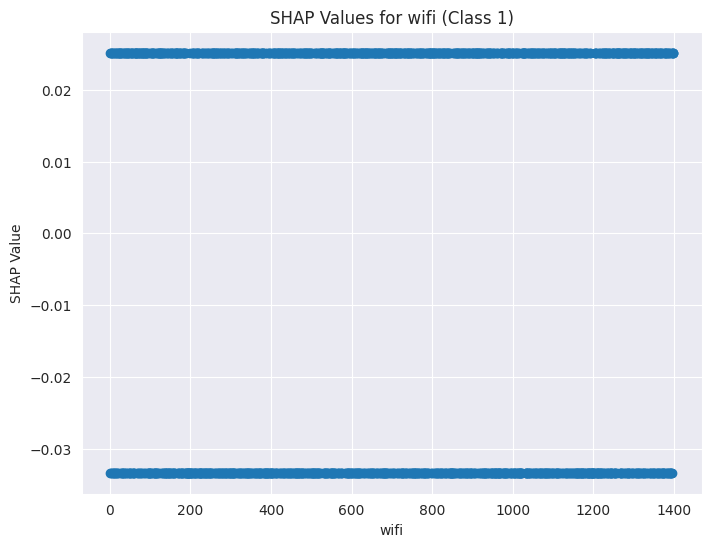

In [ ]:
import matplotlib.pyplot as plt

# SHAP explanation of a Linear Model
linear_explainer = shap.LinearExplainer(logreg, X_train)
linear_shap_values = linear_explainer(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 1

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), linear_shap_values.values[:, i, class_index])
    plt.xlabel(feature_name)
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

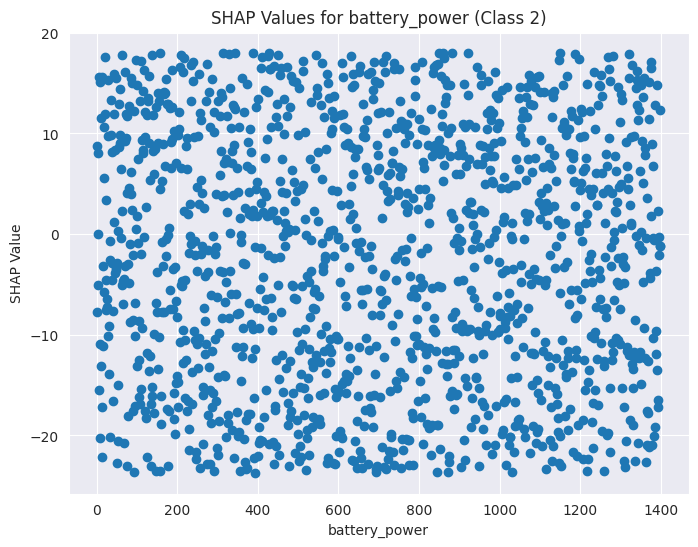

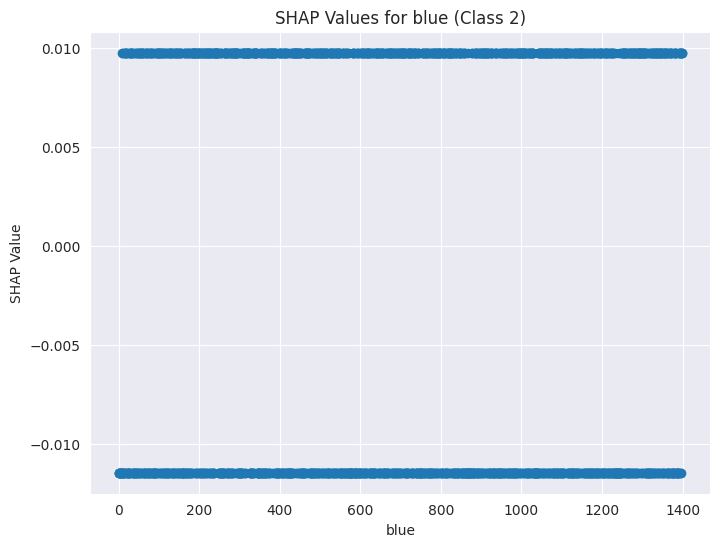

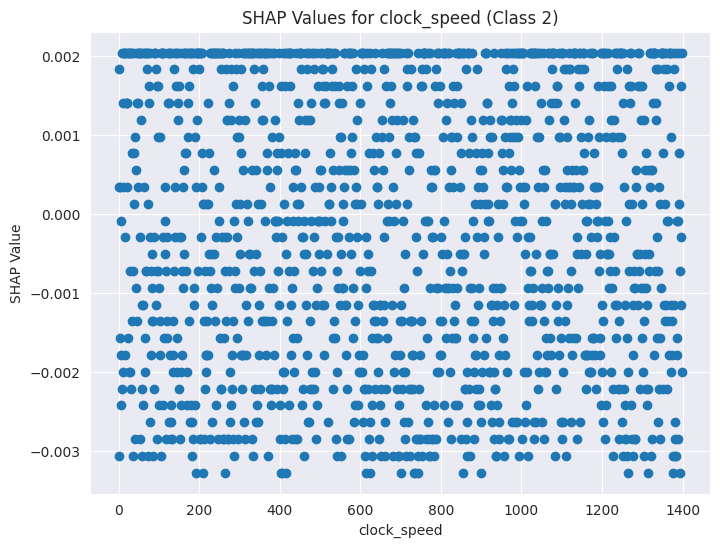

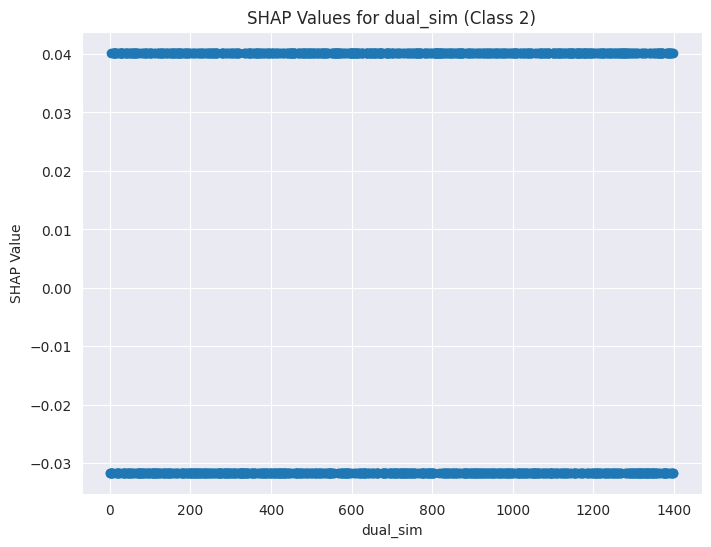

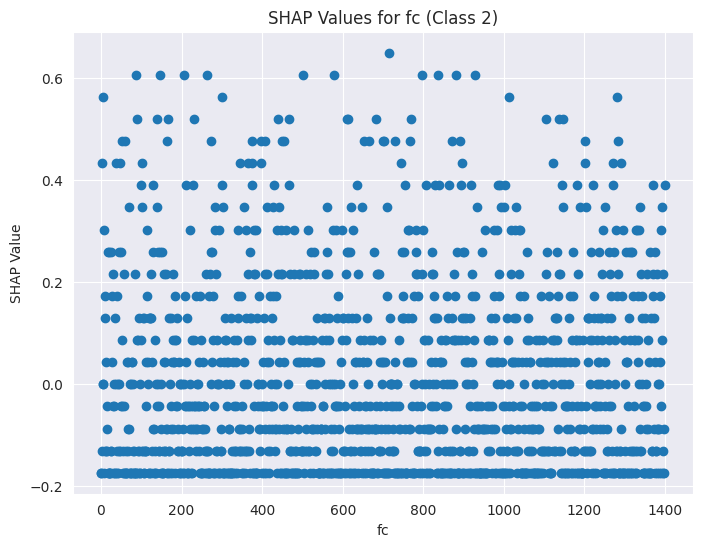

...

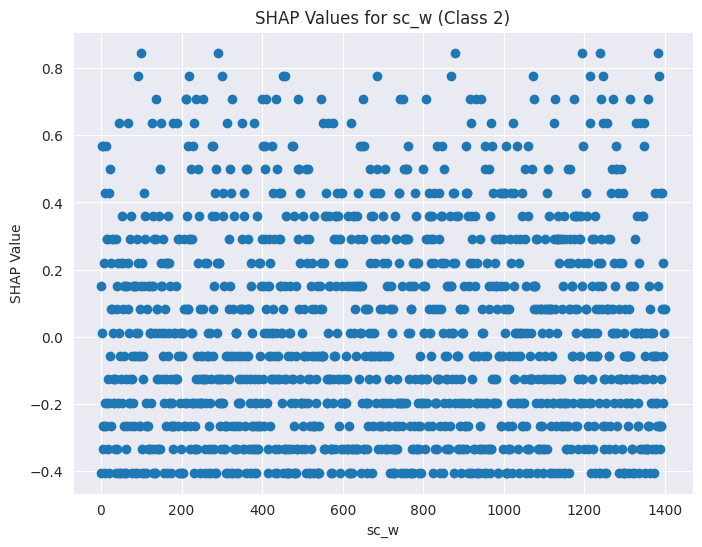

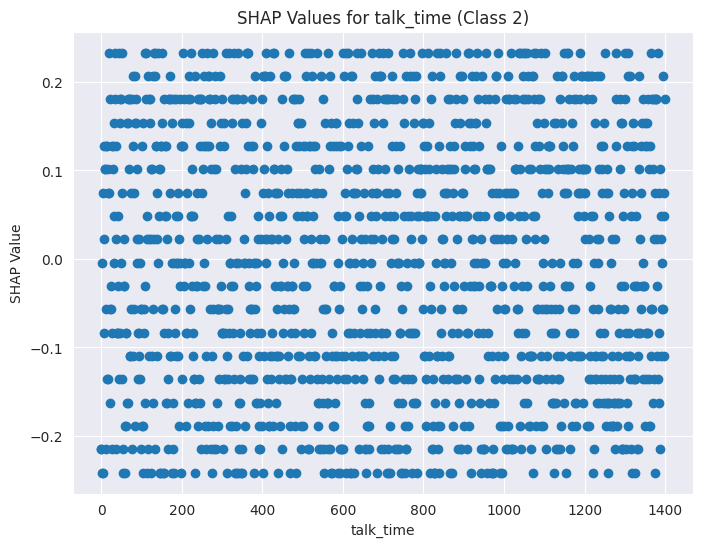

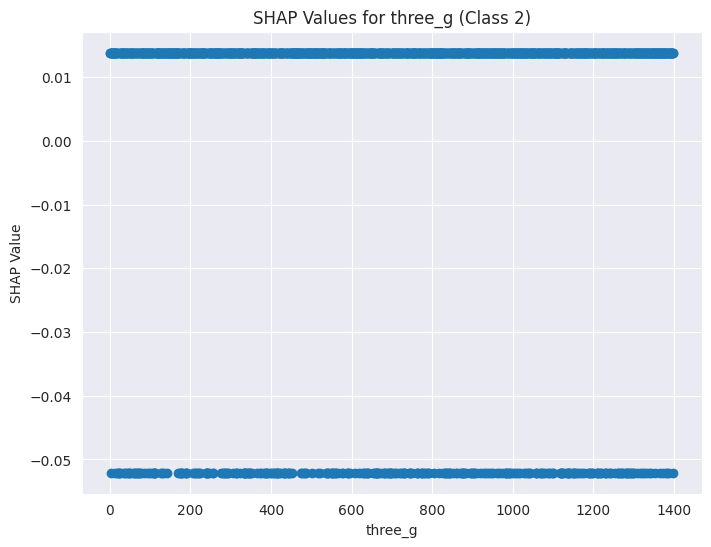

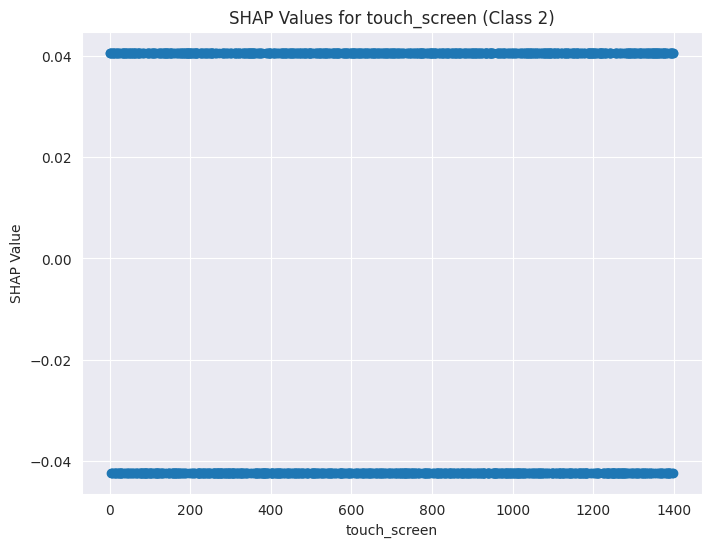

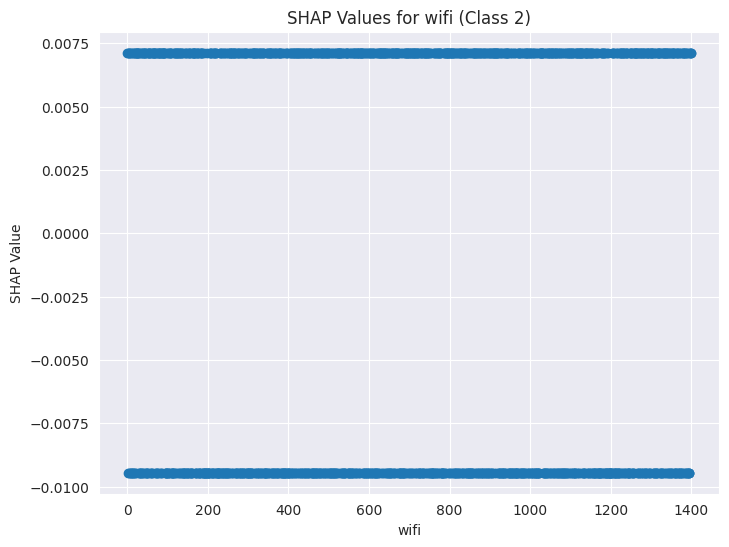

In [ ]:
import matplotlib.pyplot as plt

# SHAP explanation of a Linear Model
linear_explainer = shap.LinearExplainer(logreg, X_train)
linear_shap_values = linear_explainer(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 2

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), linear_shap_values.values[:, i, class_index])
    plt.xlabel(feature_name)
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

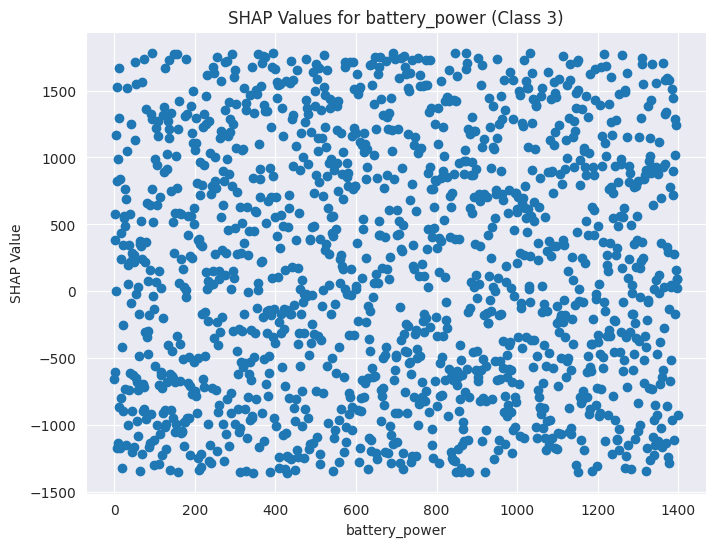

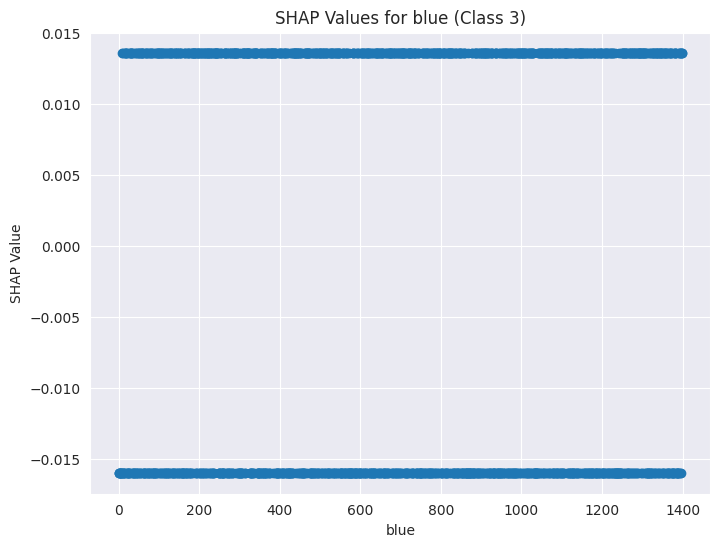

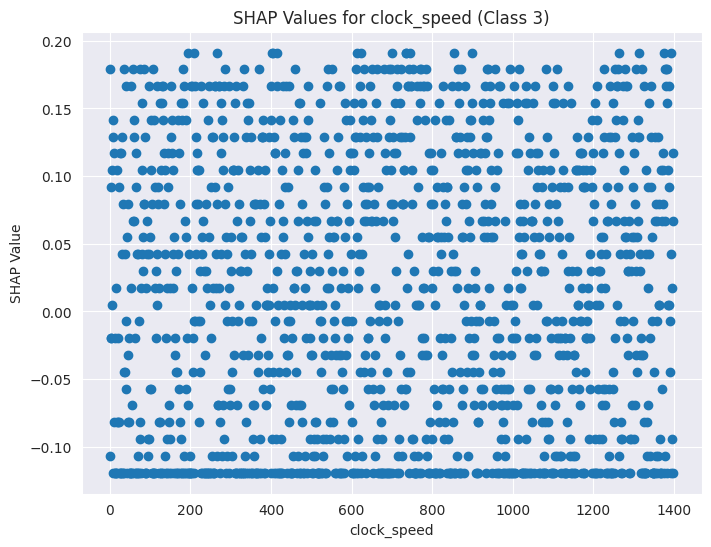

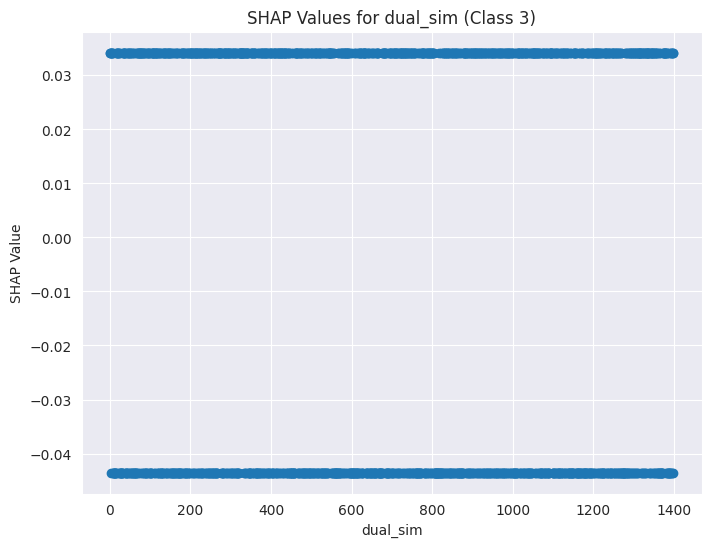

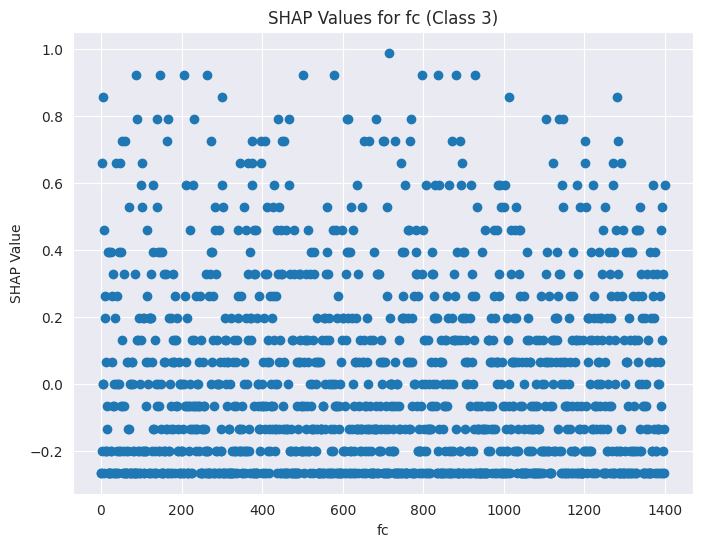

...

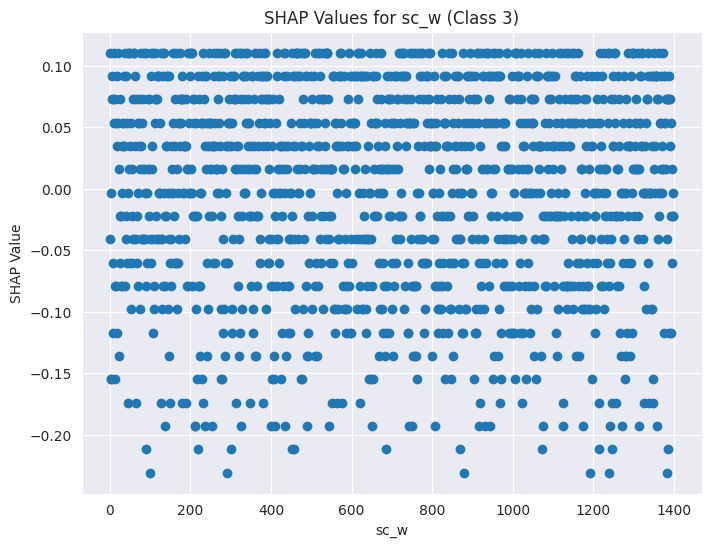

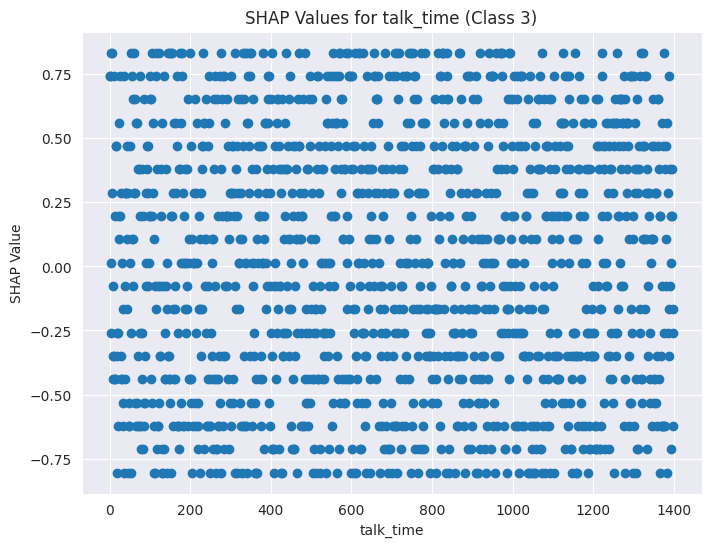

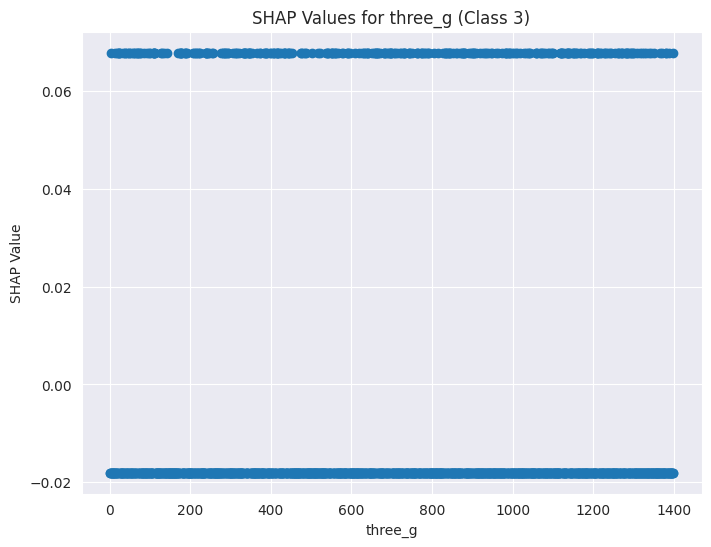

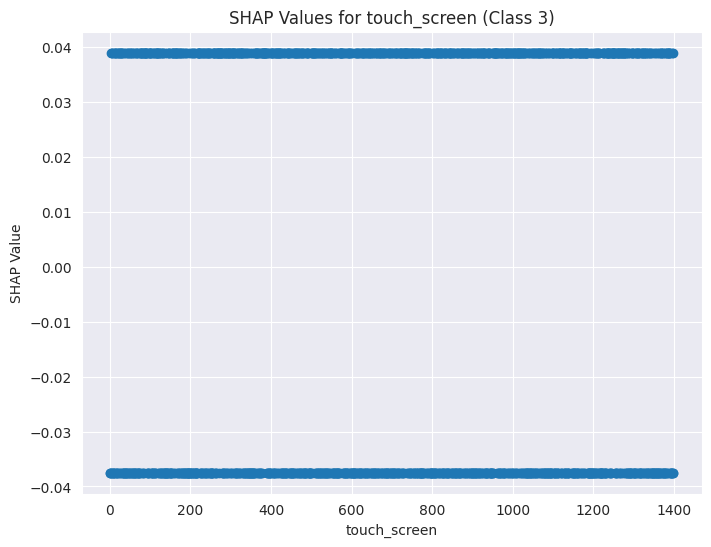

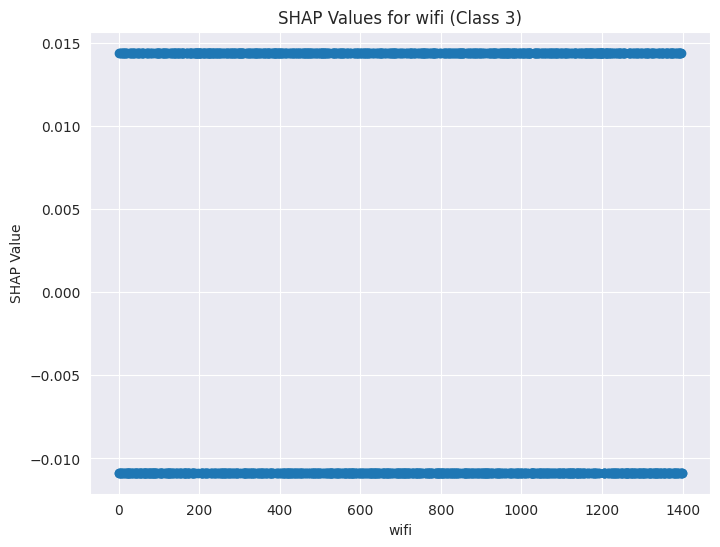

In [ ]:
import matplotlib.pyplot as plt

# SHAP explanation of a Linear Model
linear_explainer = shap.LinearExplainer(logreg, X_train)
linear_shap_values = linear_explainer(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 3

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), linear_shap_values.values[:, i, class_index])
    plt.xlabel(feature_name)
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

**Tree Based Model**

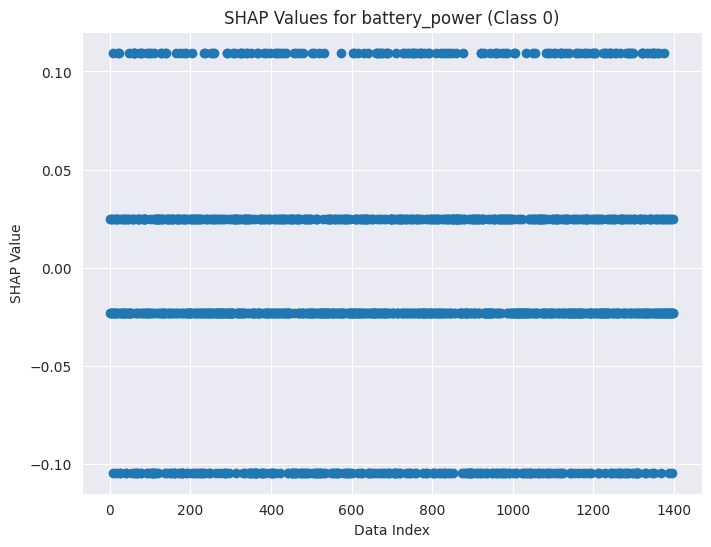

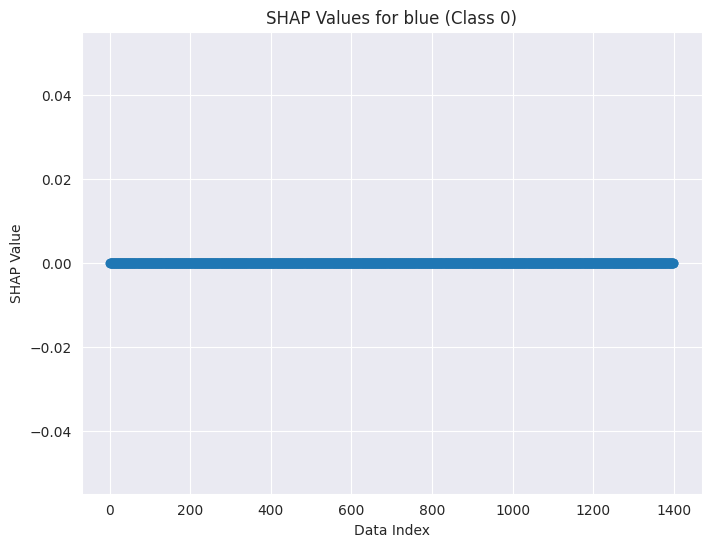

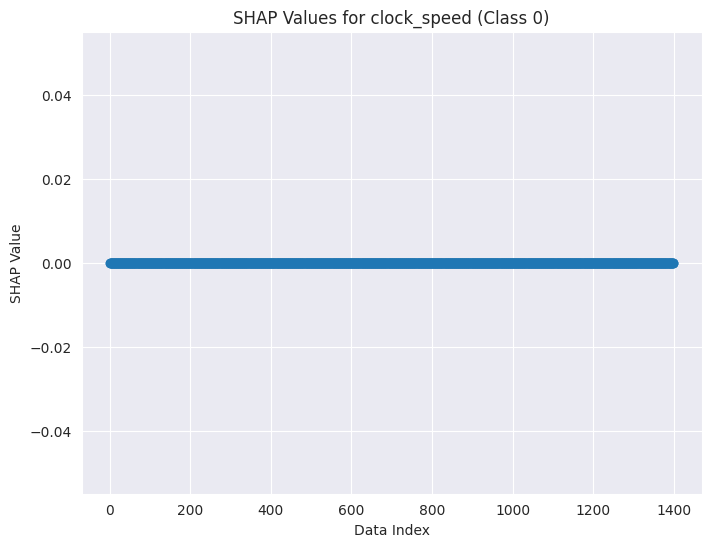

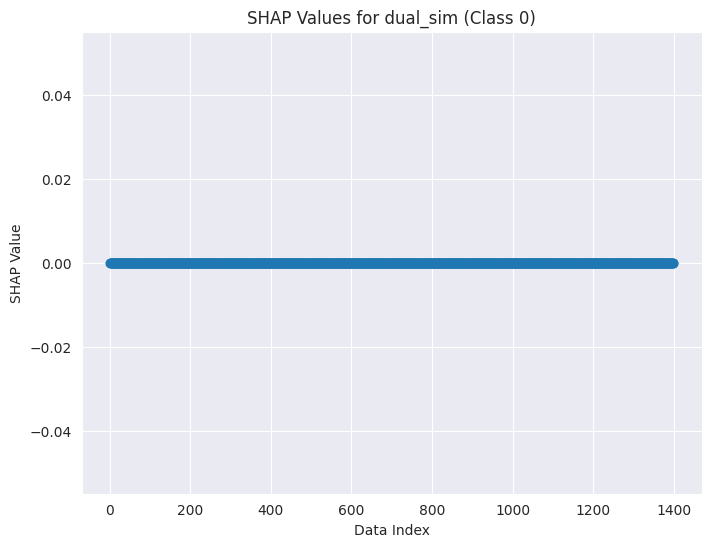

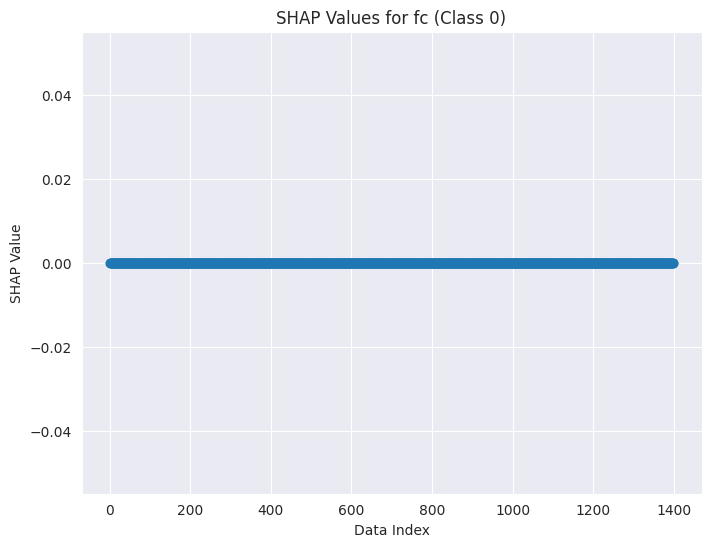

...

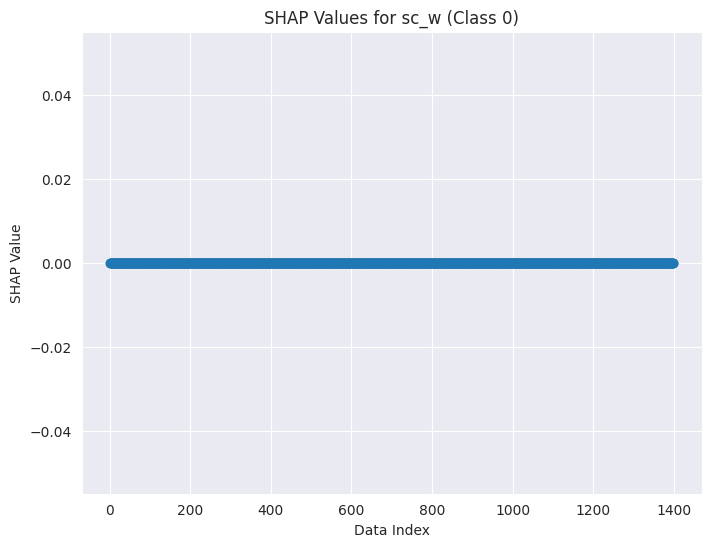

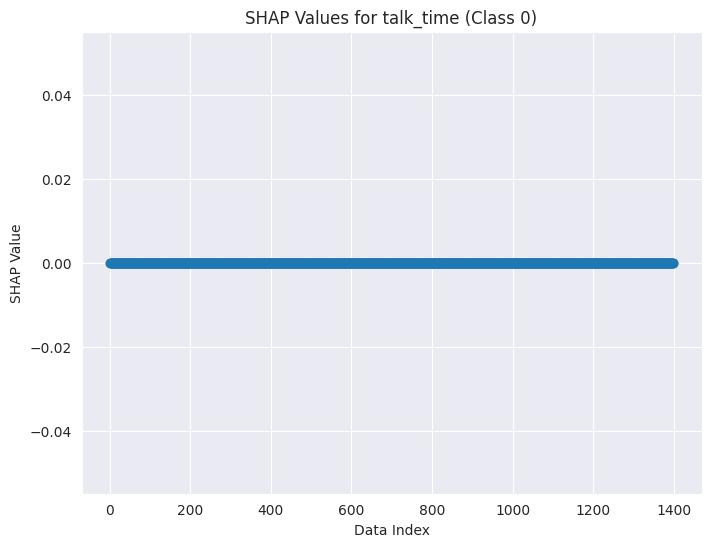

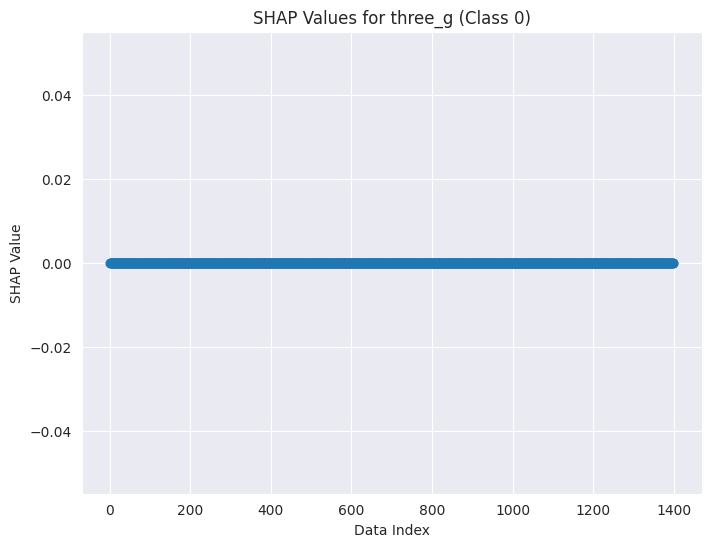

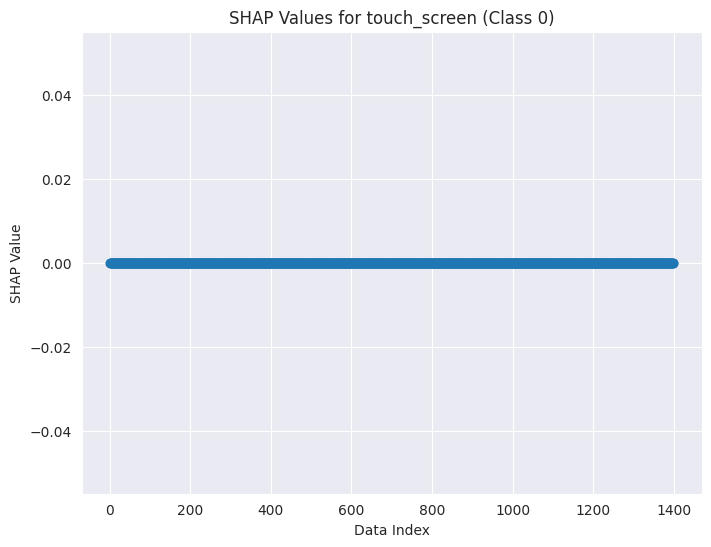

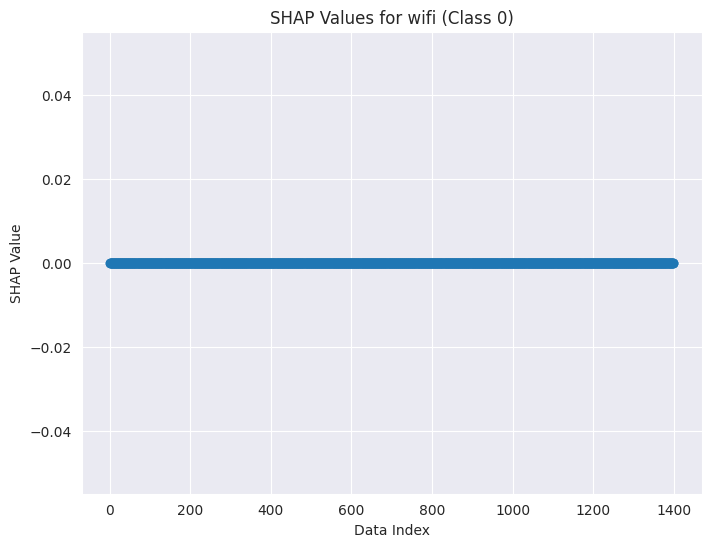

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd

# SHAP explanation of a tree-based model
tree_explainer = shap.TreeExplainer(dtc, X_train)
tree_shap_values = tree_explainer.shap_values(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 0

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), tree_shap_values[class_index][:, i])
    plt.xlabel("Data Index")
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

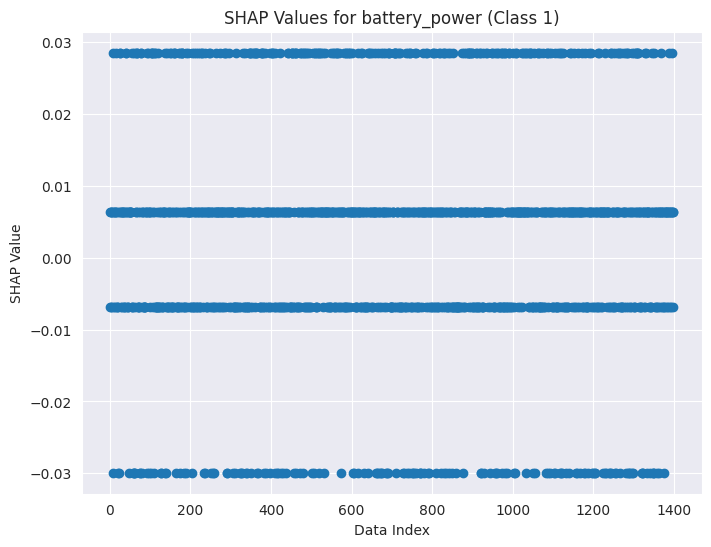

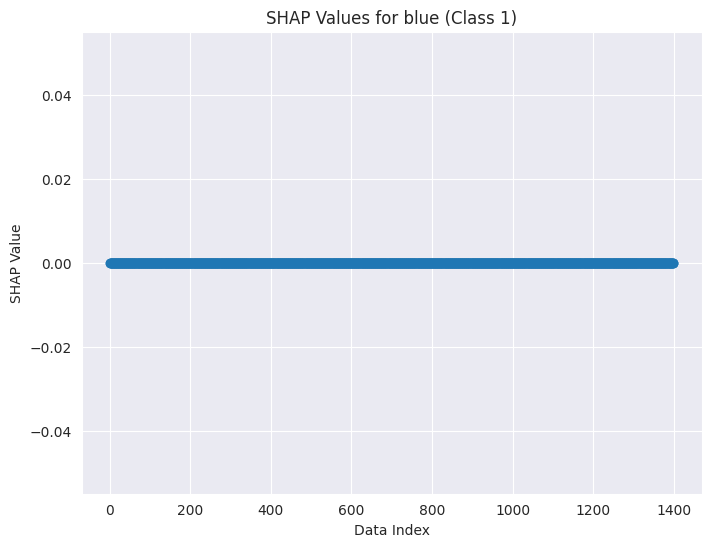

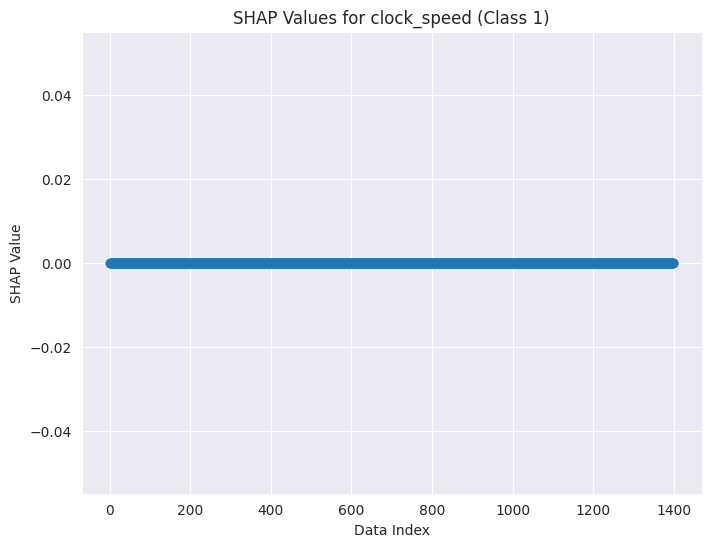

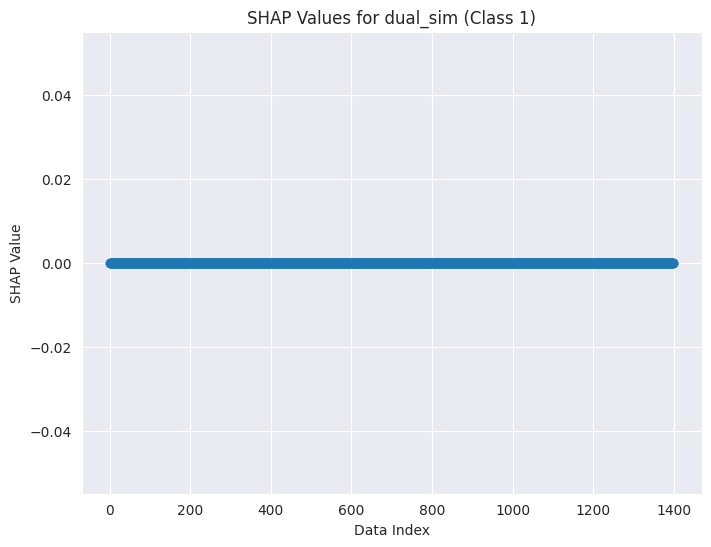

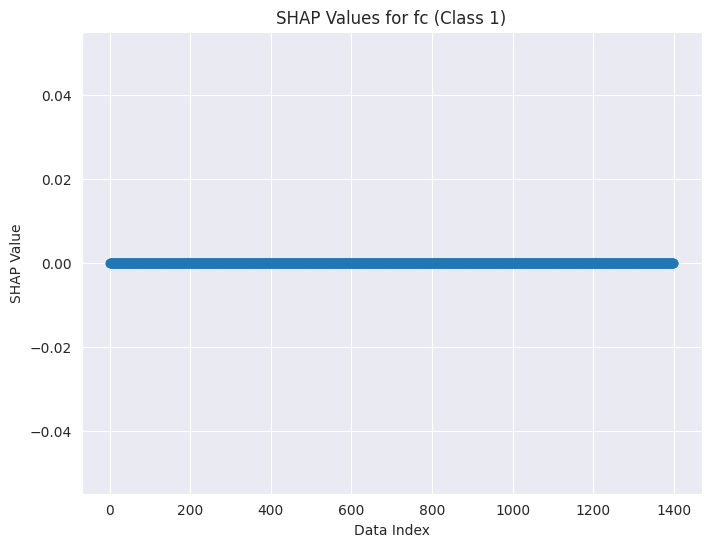

...

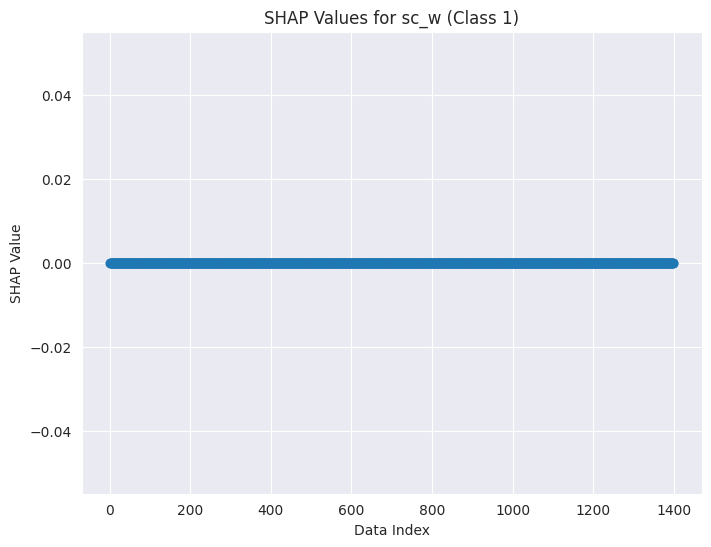

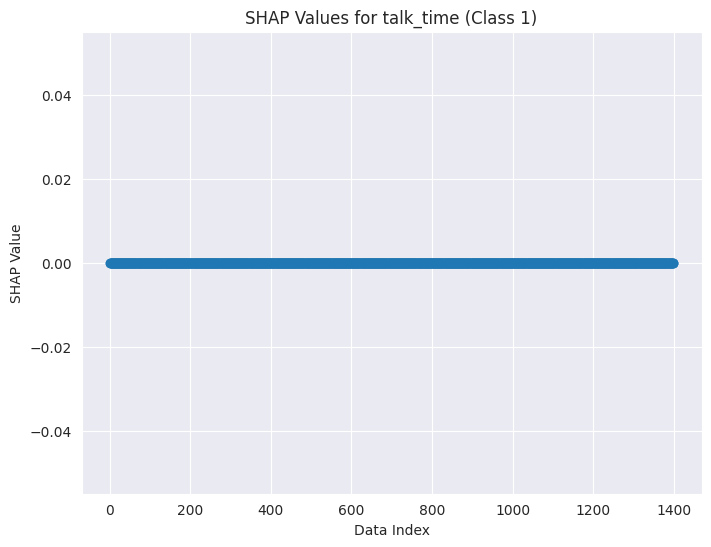

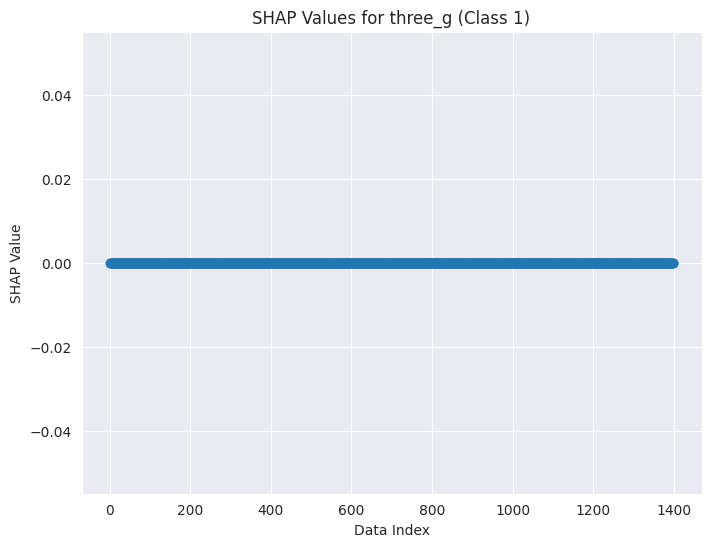

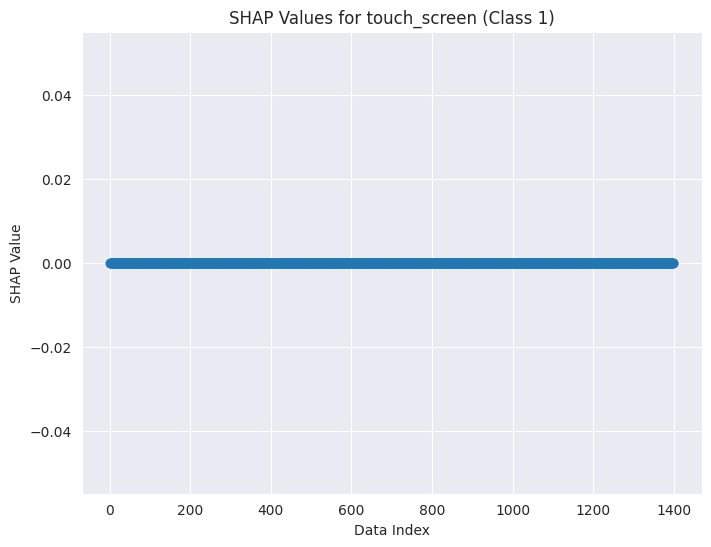

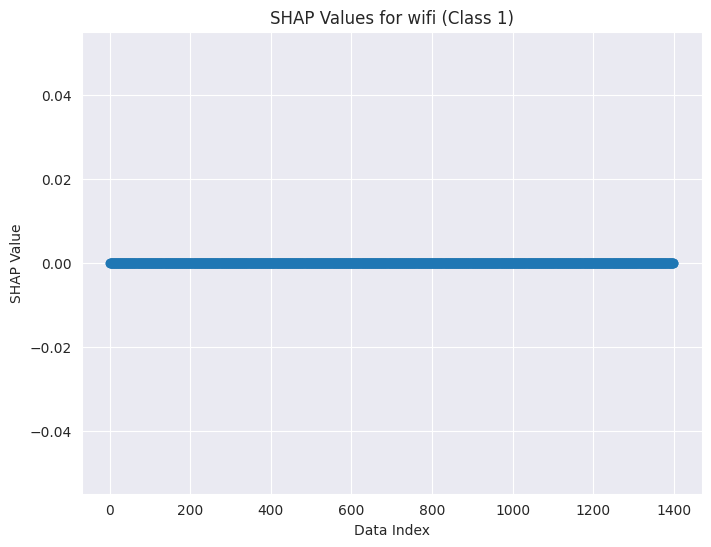

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd

# SHAP explanation of a tree-based model
tree_explainer = shap.TreeExplainer(dtc, X_train)
tree_shap_values = tree_explainer.shap_values(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 1

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), tree_shap_values[class_index][:, i])
    plt.xlabel("Data Index")
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

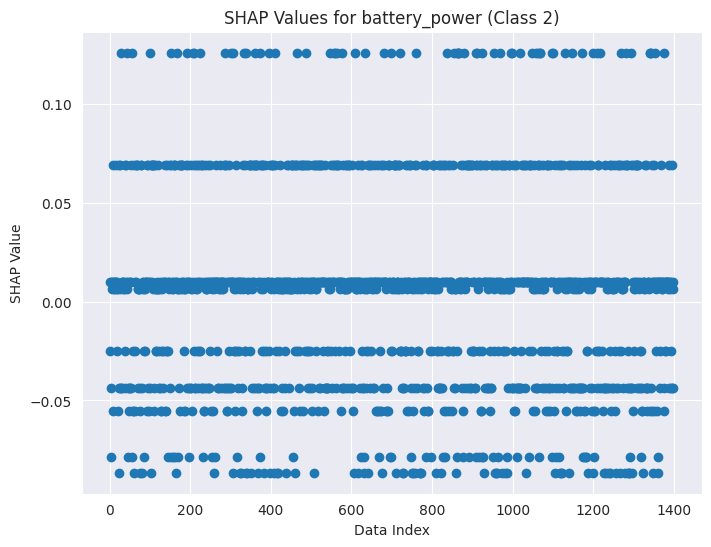

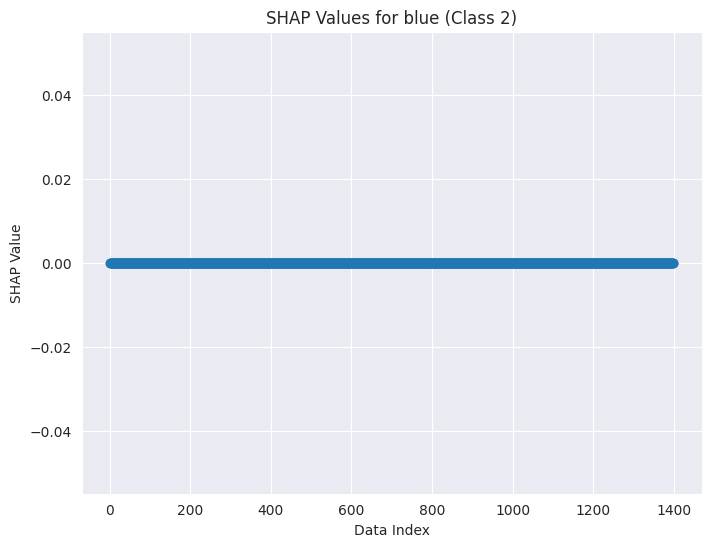

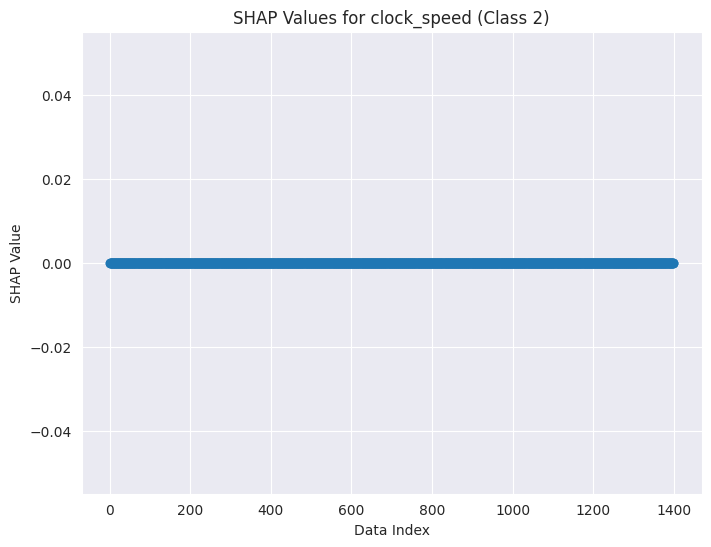

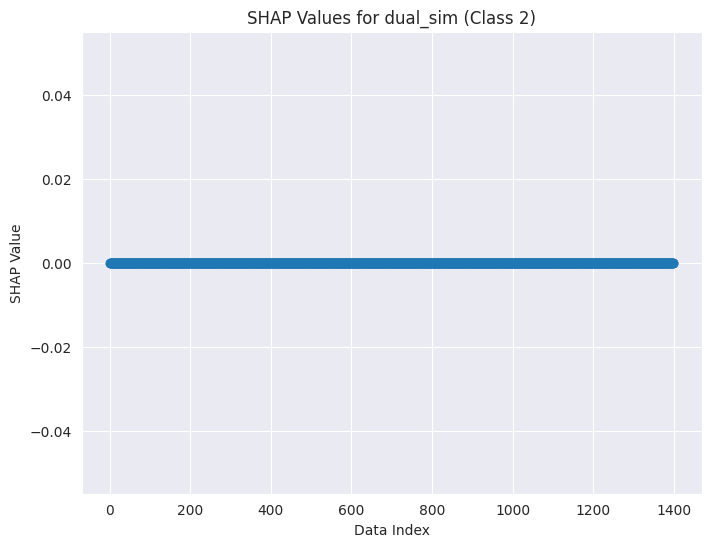

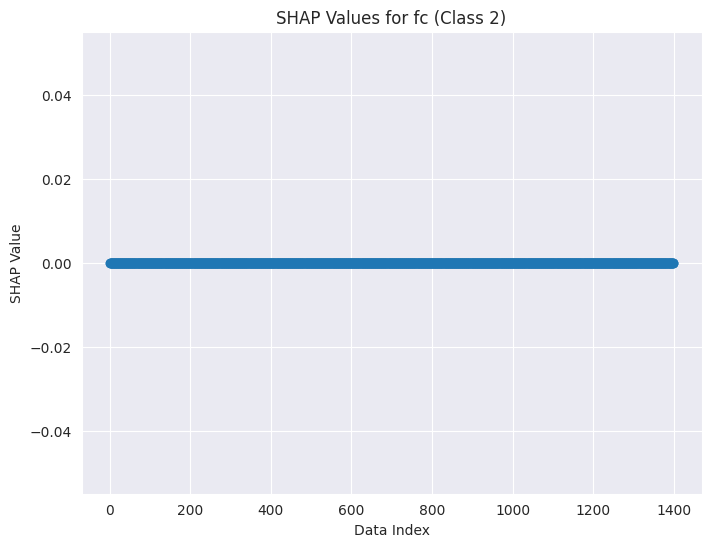

...

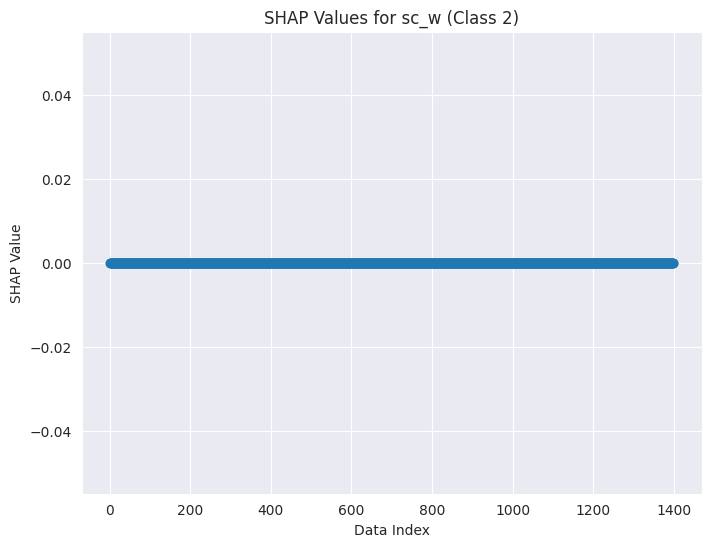

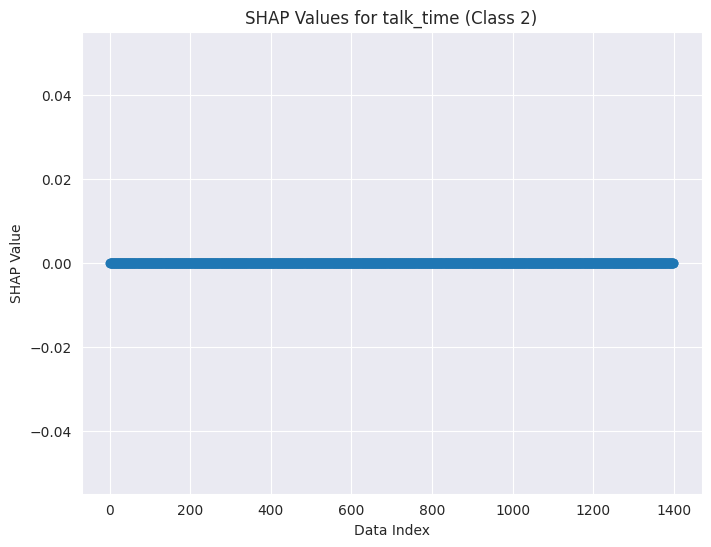

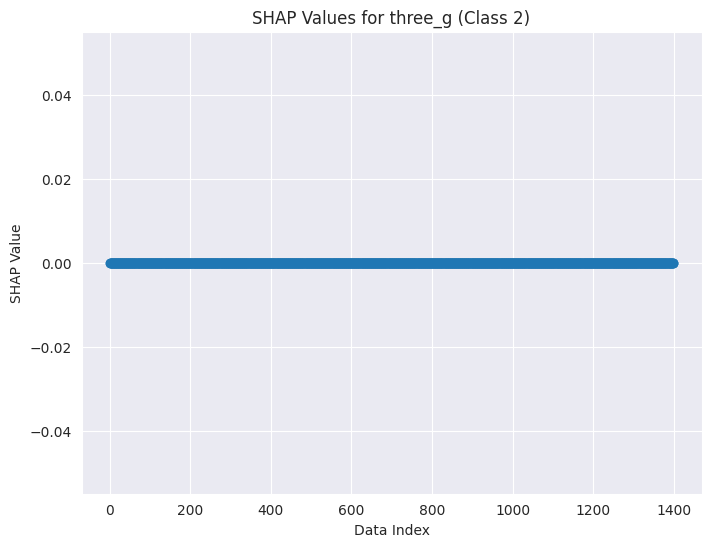

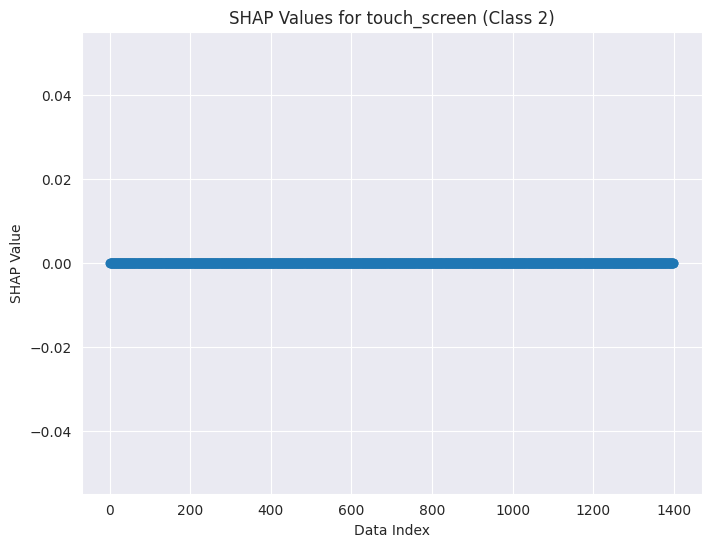

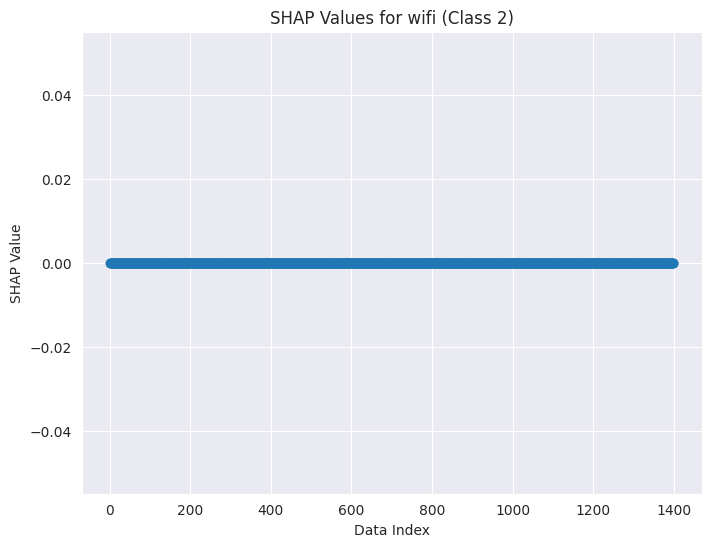

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd

# SHAP explanation of a tree-based model
tree_explainer = shap.TreeExplainer(dtc, X_train)
tree_shap_values = tree_explainer.shap_values(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Choose the class index
class_index = 2

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), tree_shap_values[class_index][:, i])
    plt.xlabel("Data Index")
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

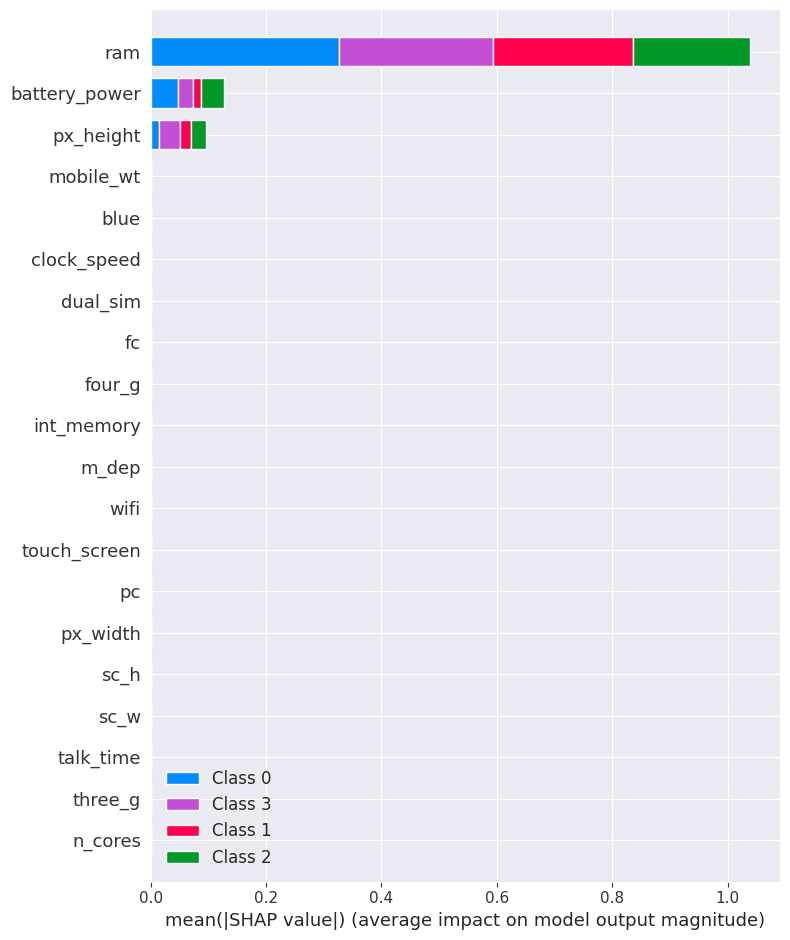

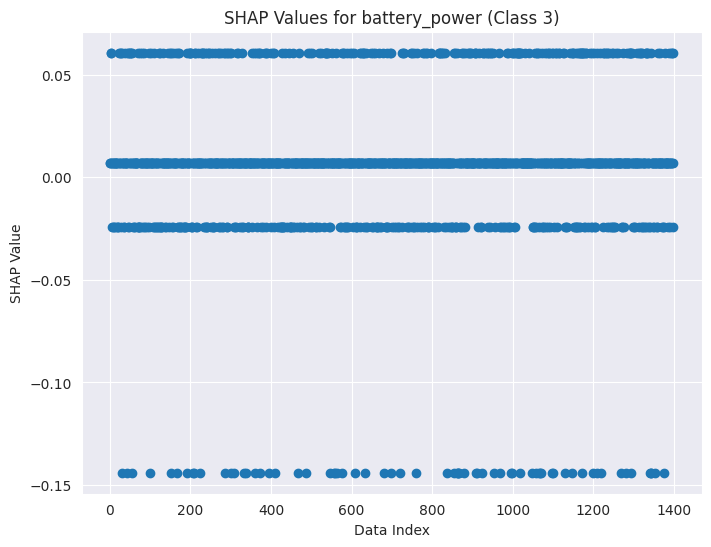

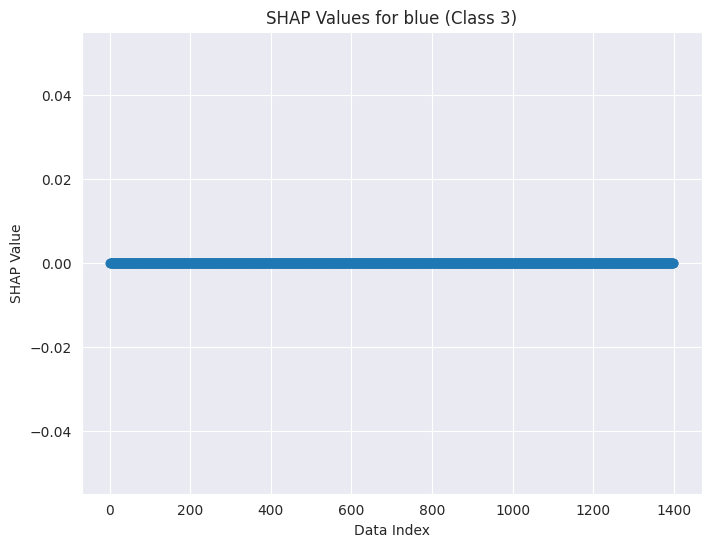

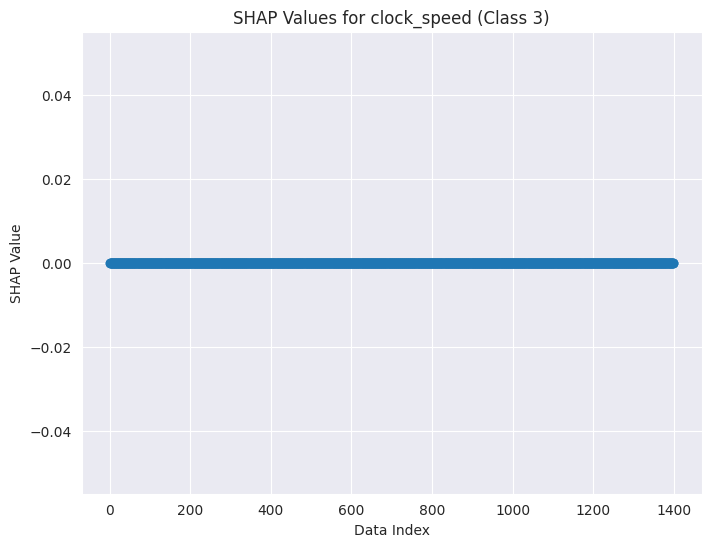

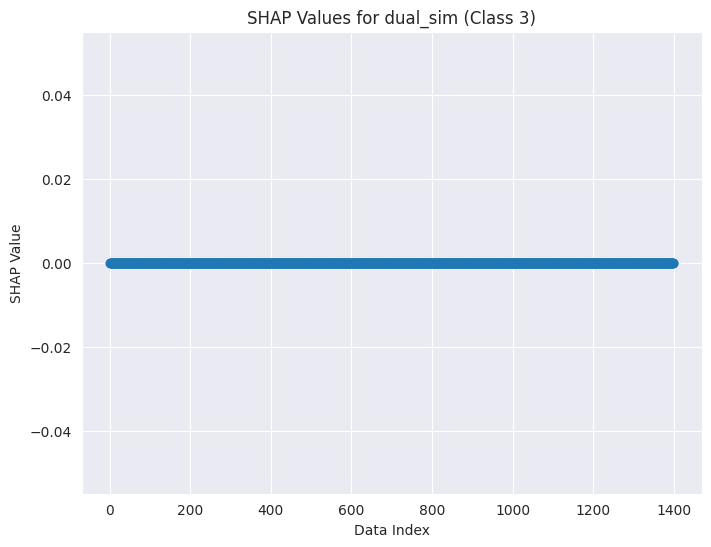

...

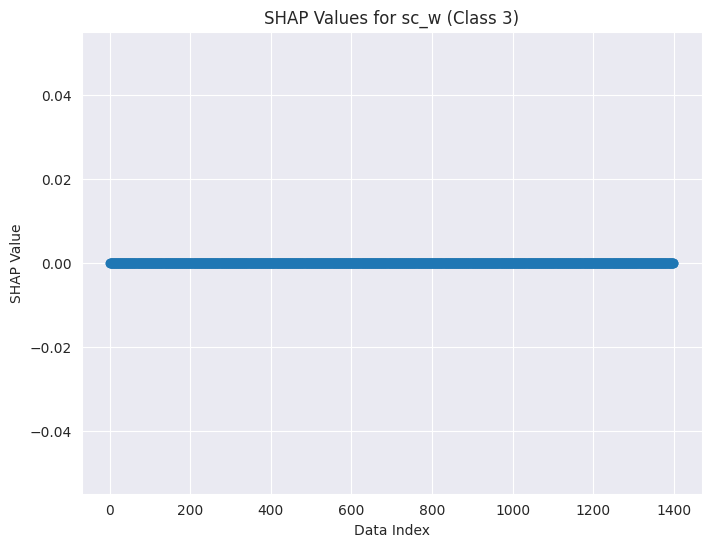

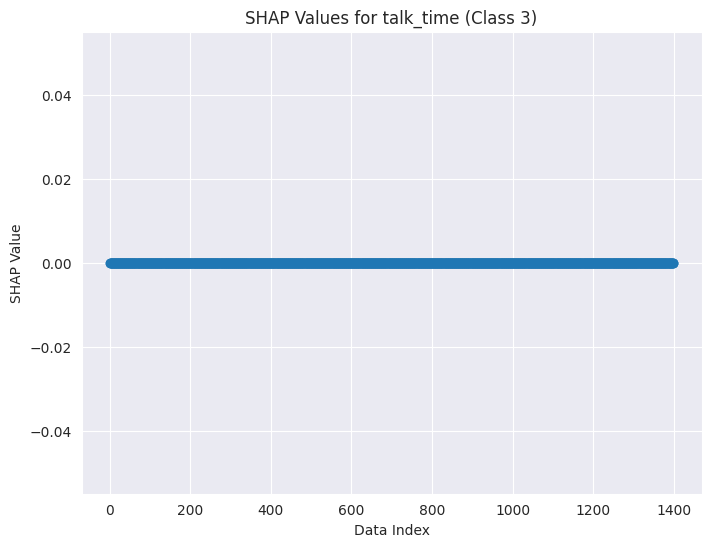

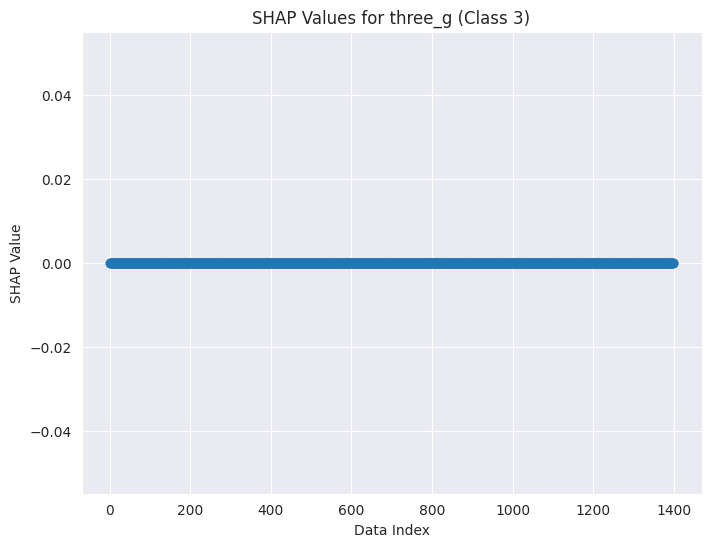

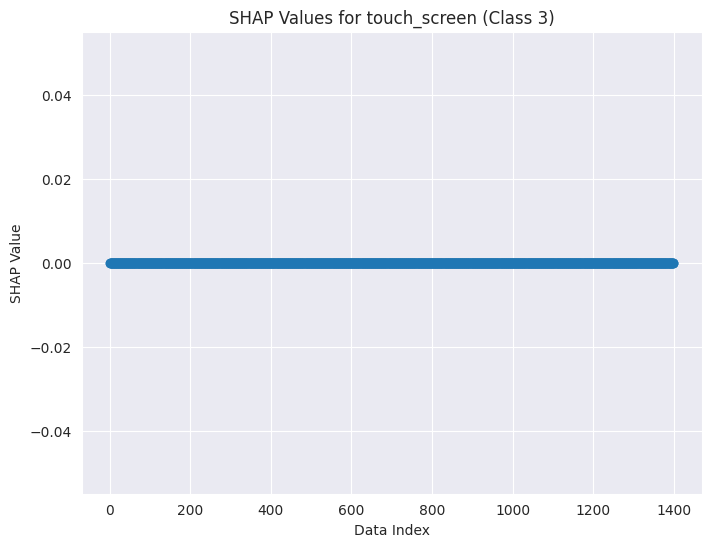

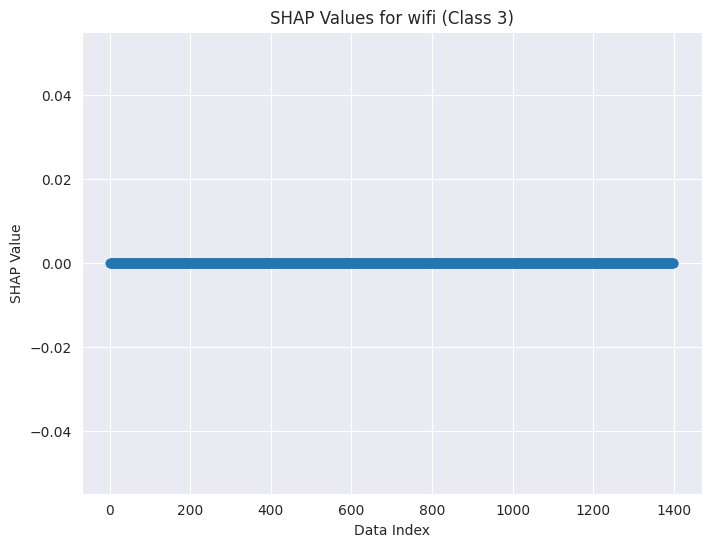

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd

# SHAP explanation of a tree-based model
tree_explainer = shap.TreeExplainer(dtc, X_train)
tree_shap_values = tree_explainer.shap_values(X_train)

# Convert the feature names to a NumPy array
feature_names = X_train.columns.to_numpy()

# Create a summary plot (Feature Importance Plot)
shap.summary_plot(tree_shap_values, X_train, feature_names=feature_names)

# Choose the class index
class_index = 3

# Create SHAP scatter plots for each feature for the chosen class
for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(X_train.shape[0]), tree_shap_values[class_index][:, i])
    plt.xlabel("Data Index")
    plt.ylabel("SHAP Value")
    plt.title(f"SHAP Values for {feature_name} (Class {class_index})")
    plt.show()

# SHAP Feature importance for linear and tree based models

**Linear Model**

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


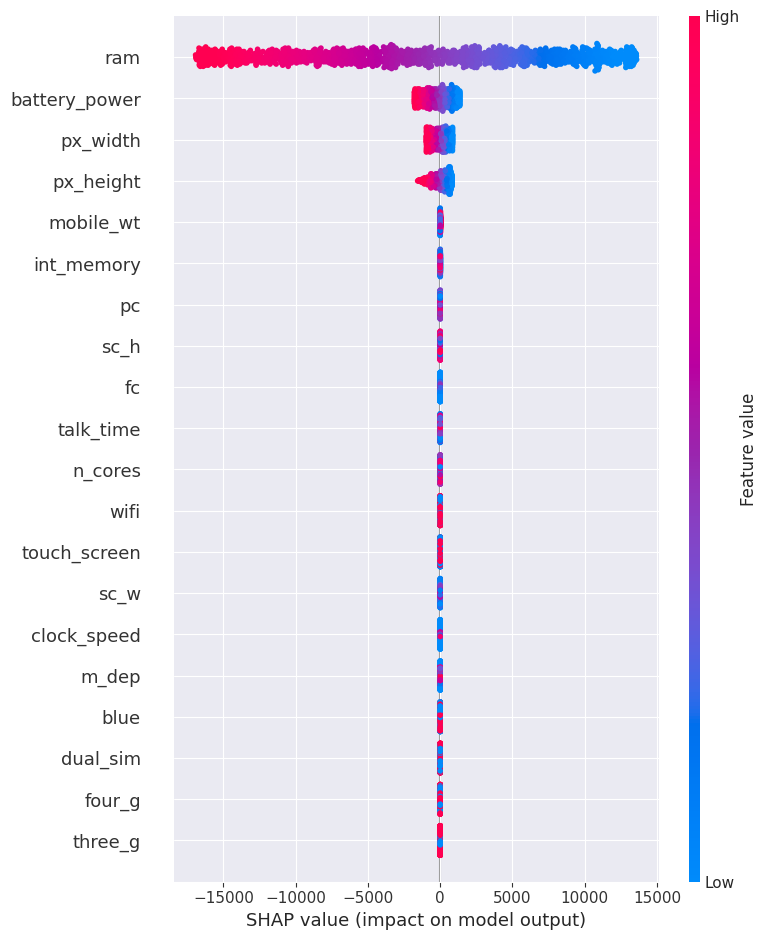

In [ ]:
# Choose the class index
class_index = 0

# SHAP variable importance for a Linear Model for the chosen class
shap.summary_plot(linear_shap_values.values[:, :, class_index], X_train)

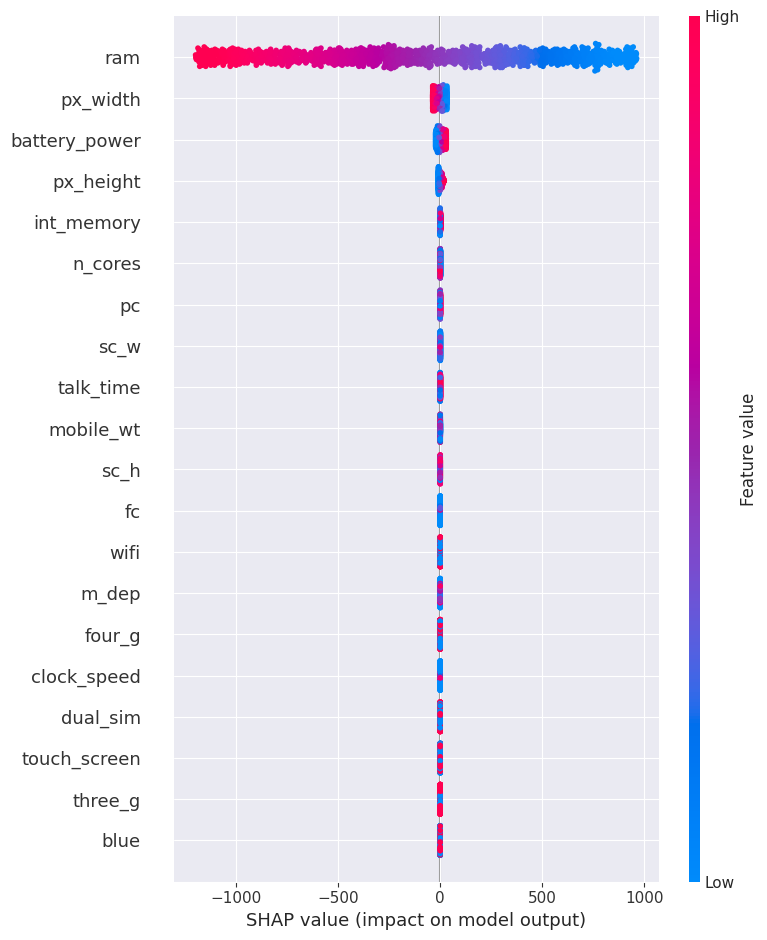

In [ ]:
# Choose the class index
class_index = 1

# SHAP variable importance for a Linear Model for the chosen class
shap.summary_plot(linear_shap_values.values[:, :, class_index], X_train)

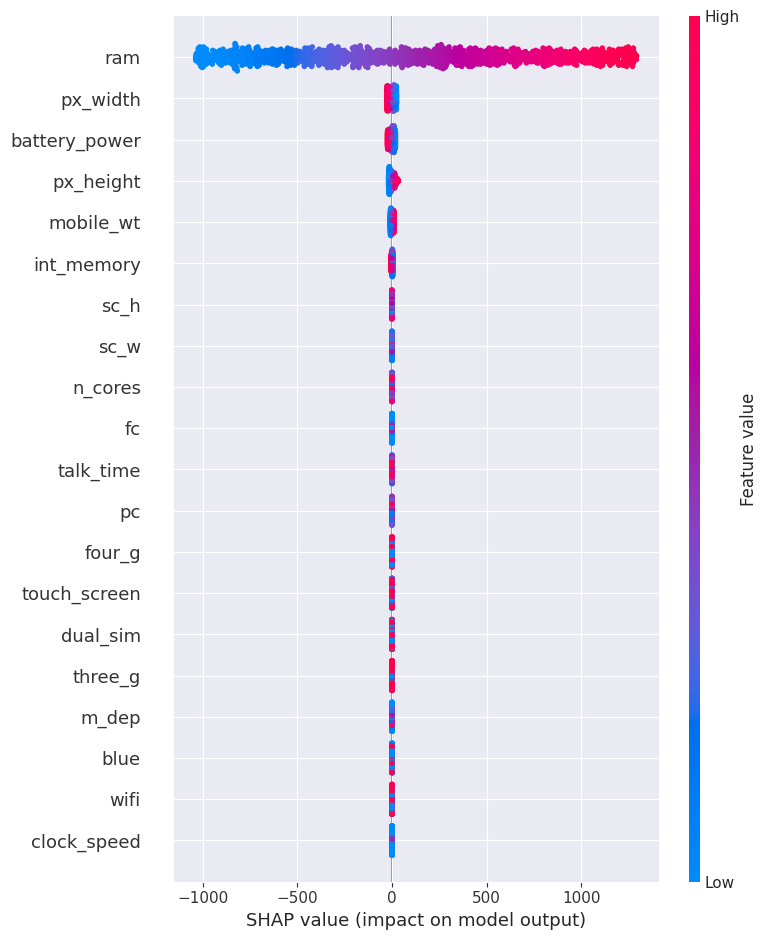

In [ ]:
# Choose the class index
class_index = 2

# SHAP variable importance for a Linear Model for the chosen class
shap.summary_plot(linear_shap_values.values[:, :, class_index], X_train)

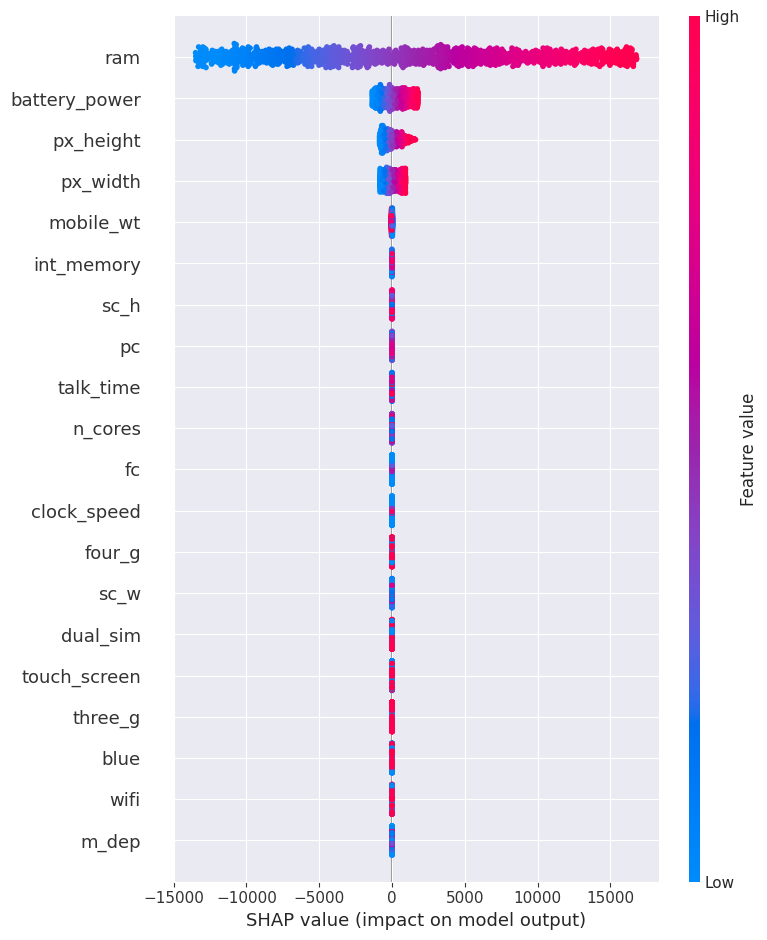

In [ ]:
# Choose the class index
class_index = 3

# SHAP variable importance for a Linear Model for the chosen class
shap.summary_plot(linear_shap_values.values[:, :, class_index], X_train)

**Linear Model Analysis**

Class 0: Looking at the SHAP values for the most significant features, we can see that they show a strong negative trend, i.e, their increase shows a decrease in the SHAP values and vice versa. It means that their increase will reduce the likelihood of this class.

Class 1: Looking at the SHAP values, we can see that ram and px_width show a negative trend, while battery_power and px_height show a somewhat positive trend. Which in this case indicates that although the increase in ram and px_width values will still decrease the likelihood of this class, this time, the increase in battery_power and px_height will increase the likelihood of this class, even if by a little.

Class 2: In class 2, ram shows a strong positive trend, while px_height and mobile_wt show a little positive trend. battery_power and px_width still show negative trend. It means that the increase of the positive trend features will increase the likelihod of this class' occurence, the negative trend features' increase will decrease it.

Class 3: In class 3, all the significant features, namely ram, battery_power, px_width, and px_height show a very strong positive trend, which in this case, indicates that an increase in any one of their values will highly increase the likelihood of the occurence of this class.

**Tree Based Model**

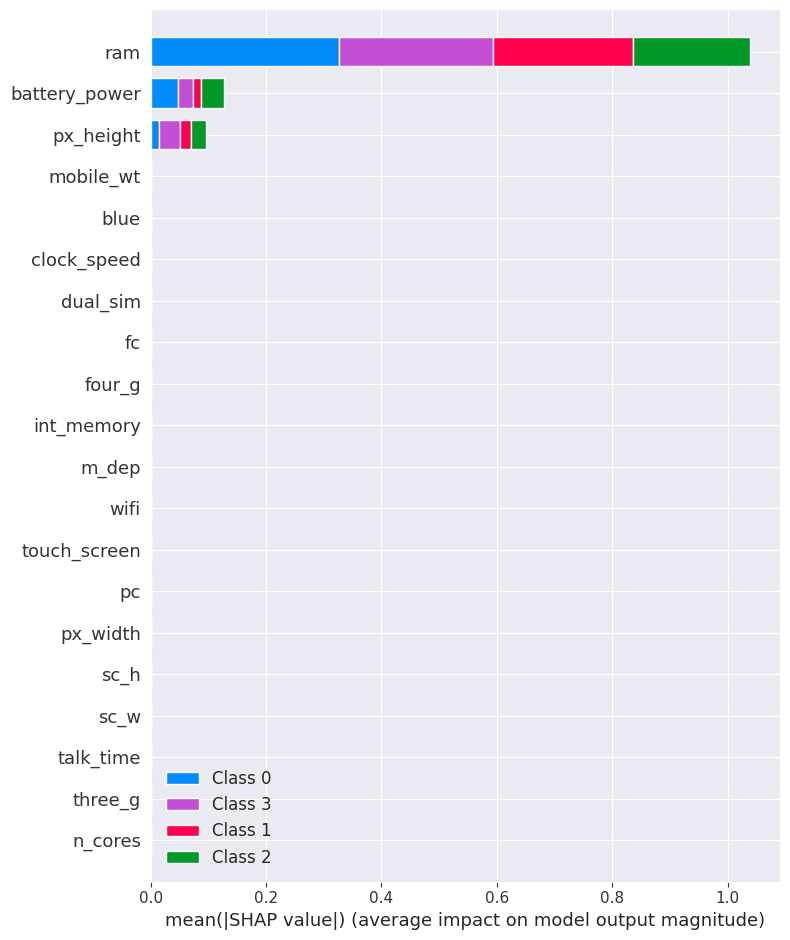

In [77]:
# Create SHAP summary plot for tree based model
shap.summary_plot(tree_shap_values, X_train)

**Tree Based Model Analysis**

As we can see from the bar plot above, the 3 features with the most significant impact on the shap values are ram, battery_power, and px_height.

In the case of ram, the shap values show that the highest positive impact of ram is for class 2, and for class 1, a bit lower impact, and then for class 3 and 0 respectively. It means that the increase in ram means the highest probability of class 2, class 1, class 3, and class 0, in that order.

Same is the case for battery_power and px_height as well. The shap values show the most impact with their increase in the probability of class 2, class 1, class 3, and class 0, in that order.

The classes in question here are 0,1,2, and 3 of price_range.

# Outcomes

1. Increased understanding of different concepts of statistical learning, like AutoML, SHAP Analysis.

2. A significant amount of the effort should be spent on data preparation, such as cleaning, normalizing, feature selection, imputation, and so on.

3. Some algorithms perform significantly better than others on particular tasks, necessitating the training of multiple models and deployment of the best models.

4. SHAP Analysis is very important to understand how the model is responding to the predictor variables and thus, it helps us in processes such as feature selection.

# References

1. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb

2. https://christophm.github.io/interpretable-ml-book/shap.html

# MIT License

All code in this note is available as open source through the MIT license.

All text and images are free to use under the Creative Commons Attribution 3.0 license. https://creativecommons.org/licenses/by/3.0/us/

These licenses let others distribute, remix, tweak, and build upon the work, even commercially, as long as they give credit for the original creation.

Copyright(c) 2023 Kumar Mehul

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.